<center><h1>Laboratory of Computational Physics - Group Project</h1></center>
<center><h2>Dormant Black Holes in Binary Systems</h2></center>

<center><h2>Group 2307</h2></center>


<center><style>
table {
    font-size: 24px;
}
</style></center>

| Last Name        | First Name         |Matricola number|
|:----------------:|:------------------:|:--------------:|
| Bertinelli       | Gabriele           |1219907 (tri)   |
| Cacciola         | Martina            |2097476         |
| Pervysheva       | Yelyzaveta         |2039398         |           
| Waththe Liyanage | Wageesha Widuranga |2078719         |
|Wickramasinghe Wickramasinghe Mudiyanselage |Poornima Amali | 2088370 |

---------------------------------------------------------
---------------------------------------------------------

# Table of Contents: <a class="anchor" id="toc"></a>
- [Overview](#overview)
- [Importing packages and modules](#importing)
- [Simulated data](#simsdata)
    - [Elapsed BWorldtime during BH+MS phase](#elapsed)
    
- [Evolution channel selectiom](#evol_chan)

- [Confirmed BH+MS systems dataframe](#confirmed) 
- [Plotting data distribution](#plot_data)

- [Classification models](#class_models)
    - [DNN](#dnn)
        - [DNN model with all the features](#dnn_all)
            - [SHAP explainer](#shap_dnn_all)
        - [DNN model for Classification of candidates](#dnn_restr)
            - [SHAP explainer](#shap_dnn_restr)
    - [Different classifier - test the performance](#diff_class)
        - [XGBoost](#xgb)
            - [XGBoost model with all the features](#xgb_all)
                - [SHAP explainer](#shap_xgb_all)
            - [XGBoost model for Classification of candidates](#xgb_restr)
                - [SHAP explainer](#shap_xgb_restr)
        - [Naive Bayesian Classifier](#nbc)
    
- [Sampling candidates values](#sampling)
- [Candidates classification](#cand_class)
    - [DNN classification](#dnn_class)
    - [XGBoost classification](#xgb_class)
    
- [Metric for evolution channels](#metric)

# Overview <a class="anchor" id="overview"></a>

With the advent of gravitational wave astrophysics and advances in precise astrometry of numerous stellar sources, the search for compact objects is thriving. Rarely seen massive binaries containing a compact object play a vital role in the evolution towards compact object mergers. With the [Gaia Data Release 3](https://www.cosmos.esa.int/web/gaia/data-release-3) (DR3), the first Gaia astrometric orbital solutions for binary sources have become available, revealing a large amount of such binary candidates. In the present notebook, we are interested in the rare cases in which a black hole (BH) is evolving in a binary system with a Main Sequence star (MS). 

Since the systems are extremely difficult to observe, we deal with Binary System Evolution (BSE) simulations, obtained via the [SEVN](https://arxiv.org/abs/2211.11774) (Stellar EVolution for N-body), a rapid binary population-synthesis code. In this way we can compare the few candidates found with a large synthetic dataset. It gets as input the initial conditions of stars or binaries (masses, spin, semi-major axis, eccentricity, etc.) and evolves them. Stellar evolution is calculated by interpolating pre-computed sets of PARSEC stellar tracks [(Bressan et al., 2012)](https://academic.oup.com/mnras/article/427/1/127/1027734?login=false). On the other hand, binary evolution is implemented by means of analytic and semi-analytic prescriptions. The implementation proves to be flexible so that every model can be easily changed or updated.

We aim to understand what kind of processes these systems are likely to experience during their lifetime: using machine learning techniques, such as Deep Neural Network and XGBoost, we tried to infer and label the properties of the known sources and understand the importance that each feature has had in the evolution of systems. We tried, moreover, to match some of the candidates to the simulated systems in order to retrieve the guessed full evolution history of those candidates.

# Import packages and modules <a class="anchor" id="importing"></a>

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sn
import math as m
import matplotlib
import itertools
from sklearn.utils import shuffle
import cmasher as cmr

import dask
import dask.dataframe as dd
import dask.array as da
import dask.bag as db

import hvplot.dask
import hvplot.pandas
import timeit

%matplotlib inline

pd.set_option('display.max_columns', None)
#sn.set_palette("pastel")

# Simulated data dataframes<a class="anchor" id="simsdata"></a>

[(To T.O.C.)](#toc)

In this section, we begin by selecting simulation results and considering different metallicities and alpha parameter values. We then narrow down our focus to systems of interest, specifically those composed of a Black Hole (BH) and a Main Sequence (MS) star in a non-interacting state.  
The metallicity, denoted as Z (`z` in our code), represents the fraction of mass attributed to elements heavier than hydrogen and helium in a star. The alpha parameter, denoted ad $\alpha_{CE}$ (`a` in our code) is commonly employed to describe the efficiency of converting the orbital energy into the kinetic energy of the envelope, resulting in the ejection of the envelope.  

For our analysis, we have chosen to investigate systems with metallicities of 0.02 (solar-like systems), 0.001 (metal-poor), and 0.0001 (very metal-poor). Additionally, we have considered three different alpha parameter values: 0.1 (indicating low efficiency), 1 (intermediate efficiency), and 5 (high efficiency).  

In the cell below, the files are grouped together based on the same value of `a` to make the computation more efficient. This step is performed to prepare the files that will be utilized in the later stages of the analysis. Once this section is completed, the files will be saved as datasets, with each dataset containing systems having different metallicities but the same `a` value. It is important to run this section only to generate the required files for subsequent analysis. This process will be repeated three times, corresponding to each `a` value.

In [1]:
# Using dask to concatenate the outputs_* files 
#into a single dataframe, and then proced with the systems selection.

path = '/data1/iorio/pessoa/sevn_run/fiducial_Hrad_5M'

# Create dask dataframe for each met


#z02a1 = dd.read_csv(path + '/sevn_output_Z0.02A1L1/0/output_*.csv')
#z001a1  = dd.read_csv(path + '/sevn_output_Z0.001A1L1/0/output_*.csv')
#z0001a1 = dd.read_csv(path + '/sevn_output_Z0.0001A1L1/0/output_*.csv')

#z02a5 = dd.read_csv(path + '/sevn_output_Z0.02A5L1/0/output_*.csv')
#z001a5 = dd.read_csv(path + '/sevn_output_Z0.001A5L1/0/output_*.csv')
#z0001a5 = dd.read_csv(path + '/sevn_output_Z0.0001A5L1/0/output_*.csv')

z02a05 = dd.read_csv(path + '/sevn_output_Z0.02A0.5L1/0/output_*.csv')
z001a05 = dd.read_csv(path + '/sevn_output_Z0.001A0.5L1/0/output_*.csv')
z0001a05 = dd.read_csv(path + '/sevn_output_Z0.0001A0.5L1/0/output_*.csv')

# Assigning metallicity and alpha column

#z02a1 = z02a1.assign(z=0.02, alpha=1).astype({'z': 'float64', 'alpha': 'float64'})
#z001a1  = z001a1.assign(z=0.001, alpha=1).astype({'z': 'float64', 'alpha': 'float64'})
#z0001a1 = z0001a1.assign(z=0.0001, alpha=1).astype({'z': 'float64', 'alpha': 'float64'})

#z02a5 = z02a5.assign(z=0.02, alpha=5).astype({'z': 'float64', 'alpha': 'float64'})
#z001a5 = z001a5.assign(z=0.001, alpha=5).astype({'z': 'float64', 'alpha': 'float64'})
#z0001a5 = z0001a5.assign(z=0.0001, alpha=5).astype({'z': 'float64', 'alpha': 'float64'})

z02a05 = z02a05.assign(z=0.02, alpha=0.5).astype({'z': 'float64', 'alpha': 'float64'})
z001a05 = z001a05.assign(z=0.001, alpha=0.5).astype({'z': 'float64', 'alpha': 'float64'})
z0001a05 = z0001a05.assign(z=0.0001, alpha=0.5).astype({'z': 'float64', 'alpha': 'float64'})


# concatenating the dataframes

outputs = dd.concat([z02a05, z001a05, z0001a05])

outputs = outputs[['ID', 'name', 'Mass_0', 'Radius_0', 'Phase_0', 'RemnantType_0', 'Mass_1', 'Radius_1', 'Phase_1', 'RemnantType_1', 'Semimajor', 'Eccentricity', 'BWorldtime', 'BEvent', 'z', 'alpha']]

outputs.head(1)

,ID,name,Mass_0,Radius_0,Phase_0,RemnantType_0,Mass_1,Radius_1,Phase_1,RemnantType_1,Semimajor,Eccentricity,BWorldtime,BEvent,z,alpha
0,0,0_474492234654248,9.452887,3.734669,1,0,2.613964,1.835518,1,0,42.0,0.544,0.0,-1,0.02,0.5


In [2]:
# select bh+MS star systems

mask = (((outputs['RemnantType_0'] == 6) & (outputs['RemnantType_1'] == 0) & (outputs['Phase_1'] == 1)) | ((outputs['RemnantType_1'] == 6) & (outputs['RemnantType_0'] == 0) & (outputs['Phase_0'] == 1)))
bh_star_df = outputs[mask]

We quote the Roche Lobe radius formula for a better understanding of the code:  

$$\frac{r_1}{a}=\frac{0.49\,q\,^{2/3}}{0.6\,q\,^{2/3}\;\;+\;\ln{\bigl(1+q^{1/3}\;\bigr)} }$$

where $r_1$ is the radius of the sphere whose volume approximates the Roche lobe of mass $M_1$, $a$ is the orbital separation of the system and $q=M_1/M_2$ is the ratio of the two masses. If the radius of the star or the BH in the system is greater than the Roche Lobe radius $r_1$, then the binary is classified as interacting. Otherwise, for $r \le r_1$ it is non-interacting.

In [3]:
%%time
# selecting only binary systems

bh_star_df = bh_star_df[bh_star_df['Semimajor'].notnull()]

# dividing non-interacting and interacting sys
# by roche lobe radius

q_0 = bh_star_df['Mass_0']/bh_star_df['Mass_1']

rl_0 = (0.49*q_0**(2/3)*bh_star_df['Semimajor'])/(0.6*q_0**(2/3)+np.log(1+q_0**(1/3)))

q_1 = bh_star_df['Mass_1']/bh_star_df['Mass_0']

rl_1 = (0.49*q_1**(2/3)*bh_star_df['Semimajor'])/(0.6*q_1**(2/3)+np.log(1+q_1**(1/3)))

mask_1 = ((bh_star_df['Radius_0']>rl_0) | (bh_star_df['Radius_1']>rl_1))
mask_2 = ((bh_star_df['Radius_0']<=rl_0) | (bh_star_df['Radius_1']<= rl_1))

# creating new dataframes for interating and non interacting systems

int_binsys = bh_star_df[mask_1]

non_int_binsys = bh_star_df[mask_2]

CPU times: user 26.9 ms, sys: 1.76 ms, total: 28.6 ms
Wall time: 27.5 ms


In [4]:
%%time
# adding column Period and logP to int_binsys and non_int_binsys

from astropy import constants as const
from astropy import units as u

semimaj = int_binsys['Semimajor']* const.R_sun
mass_tot = (int_binsys['Mass_0'] * const.M_sun) + (int_binsys['Mass_1'] * const.M_sun)

s_to_day = 60*60*24

period = (2*m.pi*np.sqrt( semimaj**3 / (const.G * mass_tot) )) / s_to_day

int_binsys['Period'] = period

int_binsys['logP'] = np.log10(period)

semimaj_n = non_int_binsys['Semimajor']* const.R_sun
mass_tot_n = (non_int_binsys['Mass_0'] * const.M_sun) + (non_int_binsys['Mass_1'] * const.M_sun)

s_to_day_n = 60*60*24

period_n = (2*m.pi*np.sqrt( semimaj_n**3 / (const.G * mass_tot_n) )) / s_to_day_n

non_int_binsys['Period'] = period_n

non_int_binsys['logP'] = np.log10(period_n)

CPU times: user 306 ms, sys: 80.7 ms, total: 387 ms
Wall time: 1.12 s


## Elapsed BWorldtime during BH+MS phase <a class="anchor" id="elapsed"></a>

[(To T.O.C.)](#toc)

For visualization purposes only, we calculate the time spent by the system in the BH+MS phase.  
We commence by selecting the non-interacting systems that were previously identified. Among these systems, we retain only the first row for each system. By combining this row with the corresponding value in the `BWorldtime` column, we can determine the initial time value of the BH+MS phase.  
From the original dataset, we extract systems that are composed of a BH and a star that is no longer in the Main Sequence (MS) phase (i.e., `Phase_* > 1`). Moreover, we focus on selecting systems that are bound and we narrow down our selection to systems that are classified as non-interacting.  
Within this subset of systems, we proceed to retain only the first row for each system. By considering the corresponding value in the 'BWorldtime' column, we can determine the time at which each system exited the BH+MS phase.  
Next, we calculate the difference between this newly obtained time value and the previously calculated one. This allows us to ascertain the duration of time spent in the BH+MS phase for each system, `elapsed_bwt`.  
To summarize the relevant information, we create a dataframe that includes the following features: `ID`, `name`, `elapsed_bwt`, `z` and `alpha`.

In [5]:
%%time
df2_nint = non_int_binsys.copy().drop_duplicates(subset=['ID', 'name', 'z', 'alpha'], keep='first').rename(columns={'BWorldtime': 'BWt_start'})

#df2_int = df1_int.drop_duplicates(subset=['ID','name'], keep='first').rename(columns={'BWorldtime': 'BWt_start'})

CPU times: user 12.2 ms, sys: 14.2 ms, total: 26.3 ms
Wall time: 50.1 ms


In [6]:
%%time
#select system composed of a BH + a star that is no more a MS star (Phase_*>1)

mask_bhs = (((outputs['RemnantType_0'] == 6) & (outputs['RemnantType_1'] == 0) & (outputs['Phase_1'] > 1)) | ((outputs['RemnantType_1'] == 6) & (outputs['RemnantType_0'] == 0) & (outputs['Phase_0'] > 1)))

df3_bhs = outputs[mask_bhs]

# selecting only binary systems
df3_bhs = df3_bhs[df3_bhs['Semimajor'].notnull()]

# selecting non-interacting systems
#by roche lobe radius

q_0 = df3_bhs['Mass_0']/df3_bhs['Mass_1']

rl_0 = (0.49*q_0**(2/3)*df3_bhs['Semimajor'])/(0.6*q_0**(2/3)+np.log(1+q_0**(1/3)))

q_1 = df3_bhs['Mass_1']/df3_bhs['Mass_0']

rl_1 = (0.49*q_1**(2/3)*df3_bhs['Semimajor'])/(0.6*q_1**(2/3)+np.log(1+q_1**(1/3)))

mask_2 = ((df3_bhs['Radius_0']<=rl_0) | (df3_bhs['Radius_1']<= rl_1))

df3_bhs = df3_bhs[mask_2]

CPU times: user 36.5 ms, sys: 8.37 ms, total: 44.9 ms
Wall time: 35.6 ms


In [7]:
df3_bhs

,ID,name,Mass_0,Radius_0,Phase_0,RemnantType_0,Mass_1,Radius_1,Phase_1,RemnantType_1,Semimajor,Eccentricity,BWorldtime,BEvent,z,alpha
npartitions=1020,,,,,,,,,,,,,,,,
,int64,object,float64,float64,int64,int64,float64,float64,int64,int64,float64,float64,float64,int64,float64,float64
,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...


In [8]:
%%time

# keeping the 1st row for each system
df3_bhs = df3_bhs.drop_duplicates(subset=['ID', 'name', 'z', 'alpha'], keep='first')

df3_bhs = df3_bhs[['ID', 'name', 'BWorldtime', 'z', 'alpha']].rename(columns={'BWorldtime': 'BWt_end'})

# merging the dataframe on ID, name, z, alpha
df_bwt = df2_nint.merge(on=("ID", 'name', 'z', 'alpha'), right=df3_bhs)

# calculating the elapsed time
df_bwt['elapsed_bwt']=df_bwt['BWt_end']-df_bwt['BWt_start']

CPU times: user 36.3 ms, sys: 6.06 ms, total: 42.4 ms
Wall time: 115 ms


In [9]:
%%time

# defining and computing the final dataframe
df_bwt = df_bwt[['ID', 'name', 'elapsed_bwt', 'z', 'alpha']]

df_bwt = df_bwt.compute()

CPU times: user 38min 46s, sys: 19min 56s, total: 58min 42s
Wall time: 11min 33s


------------------------------------------------------------
------------------------------------------------------------

# Evolution channel selection <a class="anchor" id="evol_chan"></a>

[(To T.O.C.)](#toc)

The SEVN simulation records each evolutionary phase the two objects underwent, so we can add a label to the selected ones to indicate the type of interaction that occurred when the system consisted of two stars. We divide the systems according to the following: at least one Common Envelope (`CE`), stable Mass Transfer (`MT`) and non-interacting (`NI`). Adding labels to the systems is crucial for our project's requirements and goals.  
We proceed by creating a series of masks, applying them in succession, and computing dask dataframes from time to time. The label is assigned based on the value of the `BEvent` column, which records each time the system experiences a binary event/evolution.

If you want to avoid 'label encoding', change the string labels as it follows:

```python
CE == 0, MT == 1, NI == 2
```

In [10]:
# Selecting just the usefull columns

outputs_2 = outputs[['ID', 'name', 'BEvent', 'RemnantType_0', 'RemnantType_1', 'z', 'alpha']].copy()

In [11]:
%%time

# Selecting systems that are in the evolutionary phase of two stars
# Selecting only `name` and `BEvent` column

mask_3 = (((outputs['RemnantType_0'] == 0)) & (outputs['RemnantType_1'] == 0))
msms_df = outputs.loc[mask_3, ['ID', 'name', 'BEvent', 'z', 'alpha']]

CPU times: user 5.58 ms, sys: 3.33 ms, total: 8.9 ms
Wall time: 13 ms


In [12]:
%%time
msms_df = msms_df.compute()

CPU times: user 36min 21s, sys: 18min 54s, total: 55min 16s
Wall time: 9min 40s


In [13]:
%%time
# Creating a mask to select systems that went through at least 1 Common Envelope
mask_CE = msms_df['BEvent'].isin([7, 9, 11, 12, 14, 15])

# Selecting the rows that match the mask
masked_ce = msms_df[mask_CE]

# Creating a new DataFrame containing the unique names of the systems previously selected
masked_CE = masked_ce.drop_duplicates(subset=['ID', 'name', 'z', 'alpha'], keep='first').copy()

# Remove the 'BEvent' column
masked_CE = masked_CE.drop('BEvent', axis=1)

# Add the 'type' column
masked_CE['type'] = 'CE'

CPU times: user 7.73 s, sys: 1.85 s, total: 9.58 s
Wall time: 9.61 s


In [14]:
%%time
# Merging the original dataframe to the masked one, 
# to add, at each row, the type of interaction: in this case CE

#msms_df2 = msms_df.drop_duplicates(subset=['ID', 'name', 'z', 'alpha'], keep='first')

out_masked = msms_df.merge(masked_CE, on=['ID', 'name', 'z', 'alpha'], how='left')

CPU times: user 58.3 s, sys: 28.6 s, total: 1min 26s
Wall time: 1min 26s


In [15]:
%%time

# Creating a mask to select systems that went through a stable Mass Transfer AND NOT a CE
mask_MT1 = (out_masked['BEvent'].isin([4, 5, 6, 8, 10, 13, 16, 17, 18, 19, 20]))
masked_mt1 = out_masked[mask_MT1]

mask_MT = (masked_mt1['type'] != 'CE')
masked_mt = masked_mt1[mask_MT]

# Creating a new DataFrame containing the unique names of the systems previously selected
masked_MT = masked_mt.drop_duplicates(subset=['ID', 'name', 'z', 'alpha'], keep='first').copy()

# Remove the 'BEvent' column
masked_MT = masked_MT.drop('BEvent', axis=1)

# Add the 'type' column
masked_MT['type'] = 'MT'

CPU times: user 17.6 s, sys: 9.17 s, total: 26.8 s
Wall time: 26.8 s


In [16]:
%%time

# Merging the original dataframe to the masked one, 
# to add, at each row, the type of interaction: in this case MT

out_masked_1 = out_masked.merge(masked_MT, on=['ID', 'name', 'z', 'alpha'], how='left')

CPU times: user 1min 1s, sys: 24.7 s, total: 1min 25s
Wall time: 1min 25s


In [17]:
%%time

# Combining the two new column generated after the merge
out_masked_1['type'] = out_masked_1['type_x'].combine_first(out_masked_1['type_y'])

# Removing the cols
out_masked_1 = out_masked_1.drop(['type_x', 'type_y'], axis=1)

CPU times: user 9.54 s, sys: 10.2 s, total: 19.8 s
Wall time: 19.7 s


In [18]:
%%time
# Filling the remaining rows (NaN) with the Non Interacting flag

out_masked_1['type'] = out_masked_1['type'].fillna('NI')

CPU times: user 4.66 s, sys: 2.61 s, total: 7.27 s
Wall time: 7.24 s


In [19]:
# Dropping duplicated `name` rows in order to save a lightweight file
type_df = out_masked_1.drop_duplicates(subset=['ID', 'name', 'z', 'alpha'], keep='first')

In [20]:
%%time

non_int_binsys = non_int_binsys.drop_duplicates(subset=['ID', 'name', 'z', 'alpha'], keep='first')

non_int_binsys = non_int_binsys.compute()

CPU times: user 31min 43s, sys: 16min 5s, total: 47min 48s
Wall time: 8min 46s


To complete the analysis, we merge the dataframe of non-interacting BH+MS systems (`non_int_binsys`) with the dataframes representing the evolution types (`type_df`) and elapsed time (`df_bwt`). Additionally, we introduce a new column to capture the total mass of each system, labeled as `tot_mass`. 
The resulting merged dataframe consists of one row per system and incorporates the most pertinent features, including `ID`, `name`, `Mass_BH`, `Mass_1`, `Eccentricity`, `logP`, `z`, `alpha`, `BEvent`, `type`, `elapsed_bwt`, and `tot_mass`.  
The dataframe is finally saved ad a .csv file.

In [21]:
# Restrict data to T, P, M, e, a, L

#restr_data_int = int_binsys[['ID', 'name', 'Mass_0', 'Mass_1', 'Eccentricity', 'Period', 'logP', 'Semimajor', 'BWorldtime', 'z', 'alpha']]
restr_data_nint = non_int_binsys[['ID', 'name', 'Mass_0', 'Mass_1', 'Eccentricity', 'logP', 'z', 'alpha']]

# Rename *_0 as *_BH
#restr_data_int = restr_data_int.rename(columns={'Radius_0': 'Radius_BH', 'Mass_0': 'Mass_BH'})
restr_data_nint = restr_data_nint.rename(columns={'Radius_0': 'Radius_BH', 'Mass_0': 'Mass_BH'})

# merging the BH+MS database with the type database
restr_data_nint = restr_data_nint.merge(type_df, on=['ID', 'name', 'z', 'alpha'], how='left')

restr_data_nint = restr_data_nint.merge(df_bwt[['ID', 'name', 'elapsed_bwt', 'z', 'alpha']], on=['ID','name', 'z', 'alpha'], how='left')

# removing unwanted column
#restr_data_nint = restr_data_nint.drop(columns=['Unnamed: 0'])

# Uncomment to keep just 1 row per system
#restr_data_nint = restr_data_nint.drop_duplicates(subset=['ID', 'name'], keep='first')

#print(np.shape(file_nint))
#print(restr_data_nint['type'].value_counts())

In [22]:
restr_data_nint['tot_mass'] = restr_data_nint['Mass_BH'] + restr_data_nint['Mass_1']

In [23]:
restr_data_nint

,ID,name,Mass_BH,Mass_1,Eccentricity,logP,z,alpha,BEvent,type,elapsed_bwt,tot_mass
0,80,0_201673565337120,17.66923,28.74325,0.212435,4.221513,0.0200,0.5,-1,NI,1.621285,46.41248
1,87,0_929528790266714,23.50375,44.82448,0.752931,5.343398,0.0200,0.5,-1,NI,0.180697,68.32823
2,109,0_889165204871227,21.41187,34.20442,0.227290,4.468927,0.0200,0.5,-1,NI,0.026888,55.61629
3,122,0_111281974618981,17.45101,19.13807,0.326498,5.457667,0.0200,0.5,-1,NI,4.488835,36.58908
4,226,0_363554648261798,16.08790,28.28335,0.112235,3.496335,0.0200,0.5,-1,NI,1.450930,44.37125
...,...,...,...,...,...,...,...,...,...,...,...,...
718312,4866542,0_267013324291745,42.41757,28.63872,0.154970,1.780829,0.0001,0.5,-1,MT,3.003540,71.05629
718313,4866544,0_416704546356075,13.46715,35.33748,0.010245,0.678384,0.0001,0.5,-1,MT,0.539572,48.80463
718314,4866560,0_519151801200005,17.35094,25.53139,0.263572,0.984609,0.0001,0.5,-1,MT,1.073921,42.88233
718315,4866611,0_789498943674855,32.79263,27.41356,0.474538,4.586601,0.0001,0.5,-1,NI,0.520062,60.20619


In [24]:
restr_data_nint.to_csv('../data_z02_001_0001_a05.csv')

------------------------------------
------------------------------------

# Confirmed BH+MS systems dataframe <a class="anchor" id="confirmed"></a>

[(To T.O.C.)](#toc)

There are only four binary systems, so far, confirmed to be composed of a black hole and a main sequence star: [BH1](https://academic.oup.com/mnras/article-abstract/518/1/1057/6794289?redirectedFrom=fulltext&login=false), [VFTS 243](https://www.nature.com/articles/s41550-022-01730-y), [HD130298](https://www.aanda.org/articles/aa/full_html/2022/09/aa44245-22/aa44245-22.html), [BH2](https://academic.oup.com/mnras/article-abstract/518/1/1057/6794289?redirectedFrom=fulltext&login=false).  
In this brief section, we create a dataframe with the physical parameters of these systems obtained from the literature. The systems will be plotted alongside the distribution of simulated data to gain insights into the phase space occupied by these real systems.

In [7]:
data_real = {'ID': ['R00', 'R01', 'R02', 'R03'],
        'name': ['BH1', 'VFTS 243', 'HD130298', 'BH2*'],
        'Mass_BH': [9.6, 10.1, 7.7, 8.9],
        'dMass_BH': [0.18, 2, 1.5, 0.3],
        'Mass_1': [0.93, 25.0, 24.2, 1.07],
        'dMass_1': [0.05, 2.3, 3.8, 0.19],
        'Period': [185.59, 10.4031, 14.62959, 1300],
        'dPeriod': [0.05, 0.0004, 0.00085, 26],
        'logP': np.log10([185.59, 10.4031, 14.62959, 1300]),
        'dlogP': [2.69411067e-04, 3.84500774e-05, 5.81014232e-05, 2.00000000e-02],
        'Eccentricity': [0.45, 0.017, 0.457, 0.515],
        'dEccentricity': [0.005, 0.012, 0.007, 0.01],
        'loc': ['MW', 'LMC', 'MW', 'MW'],
        'system': ['disc-field', 'OC', 'runway-field', 'field'],
        'z': ['solar', 'sub-solar', 'solar', 'solar']  
    
}

real_data = pd.DataFrame(data_real)

In [5]:
# P = np.array([185.59, 10.4031, 14.62959, 1300])
# dP = np.array([0.05, 0.0004, 0.00085, 26])

# dlogP = (1/P)*dP
# print(dlogP)

[2.69411067e-04 3.84500774e-05 5.81014232e-05 2.00000000e-02]


In [8]:
real_data

,ID,name,Mass_BH,dMass_BH,Mass_1,dMass_1,Period,dPeriod,logP,dlogP,Eccentricity,dEccentricity,loc,system,z
0,R00,BH1,9.6,0.18,0.93,0.05,185.59000,0.05000,2.268555,0.000269,0.450,0.005,MW,disc-field,solar
1,R01,VFTS 243,10.1,2.00,25.00,2.30,10.40310,0.00040,1.017163,0.000038,0.017,0.012,LMC,OC,sub-solar
2,R02,HD130298,7.7,1.50,24.20,3.80,14.62959,0.00085,1.165232,0.000058,0.457,0.007,MW,runway-field,solar
3,R03,BH2*,8.9,0.30,1.07,0.19,1300.00000,26.00000,3.113943,0.020000,0.515,0.010,MW,field,solar


# Plotting data distribution <a class="anchor" id="plot_data"></a> 

[(To T.O.C.)](#toc)

In the cell below, a plot is presented illustrating the distribution of the previously selected systems. The background layer of the plot consists of a 2D histogram. Each bin in the histogram is color-coded based on the number of systems that fall into that bin. The color scale is displayed in a colorbar and follows a logarithmic scale.

In the foreground layer, the simulated systems are plotted and categorized according to their labels: `CE`, `MT`, and `NI`. The points representing the systems are displayed with varying sizes based on the elapsed time in the BH+MS phase (`elapsed_bwt`).

By adjusting the input parameters, specifically the values of `z` and `alpha`, you can observe different distributions of the data. However, for a meaningful comparison in the phase plane, it is advisable to select simulated data that have a solar-like metallicity (`z=0.02`). This recommendation is based on the fact that three out of the four real systems have metallicities similar to that of the Sun.

In [9]:
data_a05 = pd.read_csv('../data_z02_001_0001_a05.csv')
data_a1 = pd.read_csv('../data_z02_001_0001_a1.csv')
data_a5 = pd.read_csv('../data_z02_001_0001_a5.csv')

data_tot = pd.concat([data_a05, data_a1, data_a5])

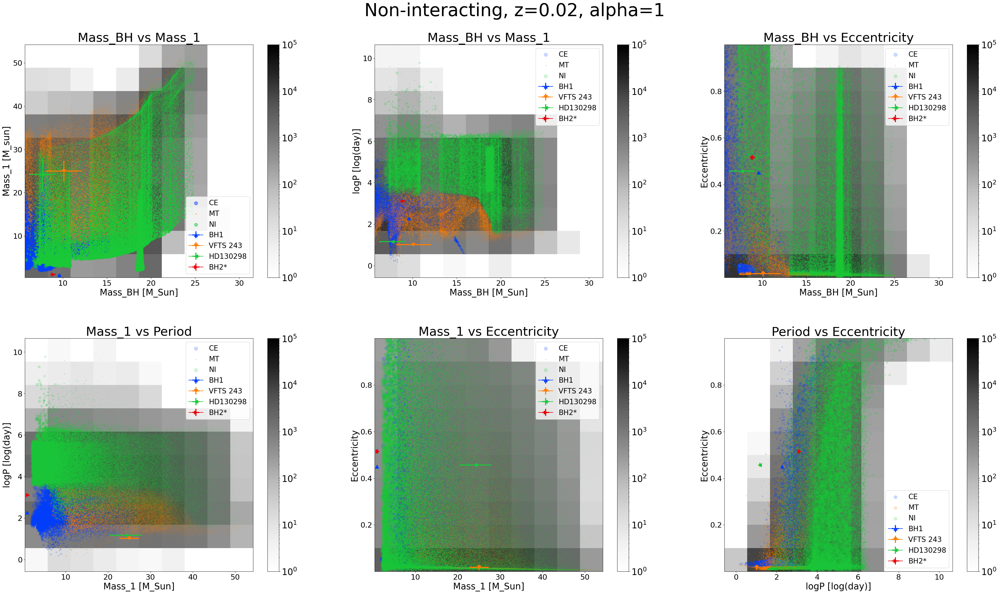

In [11]:
# Same plots as before.
# Superimposed scatter plots differentiating BH+MS sys based on their past evolution

sn.set_palette('bright')
fig, ax = plt.subplots(2,3, figsize=(43,25))
fig.tight_layout(pad=15.0)

fig.suptitle('Non-interacting, z=0.02, alpha=1', fontsize=50)

for i in range(2):
    for j in range(3):
        ax[i,j].tick_params(labelsize=21)
        ax[i,j].xaxis.label.set_size(25)
        ax[i,j].yaxis.label.set_size(25)
        
marker = itertools.cycle(('^', 'v', '<', '>'))

# defining which dataset use

restr_data_nint = data_a1[data_a1['z']==0.02]

groups = restr_data_nint.groupby('type')

plt.sca(ax[0,0])
plt.hist2d(restr_data_nint['Mass_BH'], restr_data_nint['Mass_1'], cmap='Greys', norm=matplotlib.colors.LogNorm(vmin=1, vmax=10**5))
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=25)
for i in ['BH1', 'VFTS 243', 'HD130298', 'BH2*']:    
    color = next(ax[0,0]._get_lines.prop_cycler)['color']    
    #plt.scatter(real_data[real_data['ID']==i]['Mass_BH'], real_data[real_data['ID']==i]['Period'], color=color, marker=next(marker), label=i, s=60)
    plt.errorbar(real_data[real_data['name']==i]['Mass_BH'], real_data[real_data['name']==i]['Mass_1'], xerr = real_data[real_data['name']==i]['dMass_BH'], yerr = real_data[real_data['name']==i]['dMass_1'], color=color, marker=next(marker), label=i, markersize=10, elinewidth=3)
    plt.legend(loc='best', fontsize=20)
for name, group in groups:
    plt.scatter(group.Mass_BH, group.Mass_1, marker='.', alpha=0.5, s=group.elapsed_bwt, label=name)
legend = plt.legend(fontsize=20)
plt.xlabel('Mass_BH [M_Sun]')
plt.ylabel('Mass_1 [M_sun]')
plt.title('Mass_BH vs Mass_1', fontsize=35)

plt.sca(ax[0,1])
plt.hist2d(restr_data_nint['Mass_BH'], restr_data_nint['logP'], cmap='Greys', norm=matplotlib.colors.LogNorm(vmin=1, vmax=10**5))
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=25)
for i in ['BH1', 'VFTS 243', 'HD130298', 'BH2*']:    
    color = next(ax[0,1]._get_lines.prop_cycler)['color']    
    #plt.scatter(real_data[real_data['ID']==i]['Mass_BH'], real_data[real_data['ID']==i]['Period'], color=color, marker=next(marker), label=i, s=60)
    plt.errorbar(real_data[real_data['name']==i]['Mass_BH'], real_data[real_data['name']==i]['logP'], xerr = real_data[real_data['name']==i]['dMass_BH'], yerr = abs(real_data[real_data['name']==i]['dlogP']), color=color, marker=next(marker), label=i, markersize=10, elinewidth=3)
    plt.legend(loc='best', fontsize=20)
for name, group in groups:
    plt.scatter(group.Mass_BH, group.logP, marker='.', alpha=0.2, s=group.elapsed_bwt, label=name)
legend = plt.legend(fontsize=20)
plt.xlabel('Mass_BH [M_Sun]')
plt.ylabel('logP [log(day)]')
plt.title('Mass_BH vs Mass_1', fontsize=35)

plt.sca(ax[0,2])
plt.hist2d(restr_data_nint['Mass_BH'], restr_data_nint['Eccentricity'], cmap='Greys', norm=matplotlib.colors.LogNorm(vmin=1, vmax=10**5))
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=25)
for i in ['BH1', 'VFTS 243', 'HD130298', 'BH2*']:    
    color = next(ax[0,2]._get_lines.prop_cycler)['color']    
    #plt.scatter(real_data[real_data['ID']==i]['Mass_BH'], real_data[real_data['ID']==i]['Period'], color=color, marker=next(marker), label=i, s=60)
    plt.errorbar(real_data[real_data['name']==i]['Mass_BH'], real_data[real_data['name']==i]['Eccentricity'], xerr = real_data[real_data['name']==i]['dMass_BH'], yerr = real_data[real_data['name']==i]['dEccentricity'], color=color, marker=next(marker), label=i, markersize=10, elinewidth=3)
    plt.legend(loc='best', fontsize=20)
for name, group in groups:
    plt.scatter(group.Mass_BH, group.Eccentricity, marker='.', alpha=0.2, s=group.elapsed_bwt, label=name)
legend = plt.legend(fontsize=20)
plt.xlabel('Mass_BH [M_Sun]')
plt.ylabel('Eccentricity')
plt.title('Mass_BH vs Eccentricity', fontsize=35)

plt.sca(ax[1,0])
plt.hist2d(restr_data_nint['Mass_1'], restr_data_nint['logP'], cmap='Greys', norm=matplotlib.colors.LogNorm(vmin=1, vmax=10**5))
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=25)
for i in ['BH1', 'VFTS 243', 'HD130298', 'BH2*']:    
    color = next(ax[1,0]._get_lines.prop_cycler)['color']    
    #plt.scatter(real_data[real_data['ID']==i]['Mass_BH'], real_data[real_data['ID']==i]['Period'], color=color, marker=next(marker), label=i, s=60)
    plt.errorbar(real_data[real_data['name']==i]['Mass_1'], real_data[real_data['name']==i]['logP'], xerr = real_data[real_data['name']==i]['dMass_1'], yerr = abs(real_data[real_data['name']==i]['dlogP']), color=color, marker=next(marker), label=i, markersize=10, elinewidth=3)
    plt.legend(loc='best', fontsize=20)
for name, group in groups:
    plt.scatter(group.Mass_1, group.logP, marker='.', alpha=0.2, s=group.elapsed_bwt, label=name)
legend = plt.legend(fontsize=20)
plt.xlabel('Mass_1 [M_Sun]')
plt.ylabel('logP [log(day)]')
plt.title('Mass_1 vs Period', fontsize=35)

plt.sca(ax[1,1])
plt.hist2d(restr_data_nint['Mass_1'], restr_data_nint['Eccentricity'], cmap='Greys', norm=matplotlib.colors.LogNorm(vmin=1, vmax=10**5))
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=25)
for i in ['BH1', 'VFTS 243', 'HD130298', 'BH2*']:    
    color = next(ax[1,1]._get_lines.prop_cycler)['color']    
    #plt.scatter(real_data[real_data['ID']==i]['Mass_BH'], real_data[real_data['ID']==i]['Period'], color=color, marker=next(marker), label=i, s=60)
    plt.errorbar(real_data[real_data['name']==i]['Mass_1'], real_data[real_data['name']==i]['Eccentricity'], xerr = real_data[real_data['name']==i]['dMass_1'], yerr = real_data[real_data['name']==i]['dEccentricity'], color=color, marker=next(marker), label=i, markersize=10, elinewidth=3)
    plt.legend(loc='best', fontsize=20)
for name, group in groups:
    plt.scatter(group.Mass_1, group.Eccentricity, marker='.', alpha=0.2, s=group.elapsed_bwt, label=name)
legend = plt.legend(fontsize=20)
plt.xlabel('Mass_1 [M_Sun]')
plt.ylabel('Eccentricity')
plt.title('Mass_1 vs Eccentricity', fontsize=35)

plt.sca(ax[1,2])
plt.hist2d(restr_data_nint['logP'], restr_data_nint['Eccentricity'], cmap='Greys', norm=matplotlib.colors.LogNorm(vmin=1, vmax=10**5))
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=25)
for i in ['BH1', 'VFTS 243', 'HD130298', 'BH2*']:    
    color = next(ax[1,2]._get_lines.prop_cycler)['color']    
    #plt.scatter(real_data[real_data['ID']==i]['Mass_BH'], real_data[real_data['ID']==i]['Period'], color=color, marker=next(marker), label=i, s=60)
    plt.errorbar(real_data[real_data['name']==i]['logP'], real_data[real_data['name']==i]['Eccentricity'], xerr = abs(real_data[real_data['name']==i]['dlogP']), yerr = real_data[real_data['name']==i]['dEccentricity'], color=color, marker=next(marker), label=i, markersize=10, elinewidth=3)
    plt.legend(loc='best', fontsize=20)
for name, group in groups:
    plt.scatter(group.logP, group.Eccentricity, marker='.', alpha=0.2, s=group.elapsed_bwt, label=name)
legend = plt.legend(fontsize=20)
plt.xlabel('logP [log(day)]')
plt.ylabel('Eccentricity')
plt.title('Period vs Eccentricity', fontsize=35)

legend.legendHandles[0]._sizes = [300]
legend.legendHandles[1]._sizes = [300]
legend.legendHandles[2]._sizes = [300]

plt.show()

# Uncomment the next line if you what to save the figure
#fig.savefig('./images/non_int_type_Z0.0001.png')

------------------------
------------------------

# Classification models <a class="anchor" id="class_models"></a>

[(To T.O.C.)](#toc)

In this section, we get our final dataset ready for training the classification models. We start by importing and combining all the datasets we've created earlier.

To add more randomness to the dataset, we shuffle the combined data. Shuffling the data means mixing up the order of the samples randomly. It's important because it removes any patterns or biases that might exist in the original order of the data. This way, we ensure that our training data is representative and not skewed towards any specific pattern.

We also want to create a balanced and optimal dataset for training. To achieve this, we make sure that each label category has an equal number of systems. This balancing helps prevent the model from favoring one label over another and ensures that it learns from a diverse range of samples.

In [1]:
data_a05 = pd.read_csv('../data_z02_001_0001_a05.csv')
data_a1 = pd.read_csv('../data_z02_001_0001_a1.csv')
data_a5 = pd.read_csv('../data_z02_001_0001_a5.csv')

data_tot = pd.concat([data_a05, data_a1, data_a5])

In [2]:
print('NI', len(data_tot[data_tot['type']=='NI']))
print('CE', len(data_tot[data_tot['type']=='CE']))
print('MT', len(data_tot[data_tot['type']=='MT']))

NI 1049250
CE 430242
MT 780078


In [3]:
NI = shuffle(data_tot[data_tot['type']=='NI']).head(430242)
MT = shuffle(data_tot[data_tot['type']=='MT']).head(430242)
CE = shuffle(data_tot[data_tot['type']=='CE']) 

balanced_data = pd.concat([NI, MT,CE])

shuffle_data = shuffle(balanced_data)

# DNN <a class="anchor" id="dnn"></a>

[(To T.O.C.)](#toc)


A DNN, or Deep Neural Network, is a type of artificial neural network that is designed to model and solve complex problems by learning from labeled data. It is particularly effective for supervised learning tasks, such as classification.

In a supervised learning setting, you have a dataset that consists of input data and corresponding labels or target values.

A DNN is composed of multiple layers of interconnected nodes called neurons. The neurons in each layer receive input from the neurons in the previous layer and produce an output that is passed on to the next layer. The connections between neurons are assigned weights, which determine the strength or importance of the connection.

The DNN learns to make accurate predictions by adjusting these weights during a training process. It starts with random weights and iteratively updates them to minimize the difference between its predictions and the true labels in the training data. This process is typically done using an optimization algorithm, such as gradient descent (in our case `adam`, an extended version of stochastic gradient descent).

The "deep" in deep neural networks refers to the presence of multiple hidden layers between the input and output layers. These hidden layers allow the network to learn complex and hierarchical representations of the data, enabling it to capture intricate patterns and relationships.

For a classification task, the output layer of the DNN usually consists of neurons equal to the number of classes or categories you want to classify. Each output neuron represents a specific class, and the network assigns a probability to each class based on the learned weights and biases. The class with the highest probability is chosen as the predicted class.

## DNN model with all the features <a class="anchor" id="dnn_all"></a>

[(To T.O.C.)](#toc)

In our experimentation, we conducted several tests and utilized GridSearchCV to determine the optimal structure for the Deep Neural Network (DNN). The chosen model architecture consists of four hidden layers, each comprising 20 neurons. Additionally, an input layer with the same number of neurons as features and an output layer with three neurons (equal to the number of labels to be investigated) were incorporated.

The activation function employed in the hidden layers is the [Rectified Linear Unit](https://machinelearningmastery.com/rectified-linear-activation-function-for-deep-learning-neural-networks/) (`ReLU`). For optimization, we opted for the [`Adam`](https://machinelearningmastery.com/adam-optimization-algorithm-for-deep-learning/) optimizer. Alternatively, the [`AdaMax`](https://paperswithcode.com/method/adamax) optimizer could yield similar results.

Given that the objective of the model is to classify new data, we selected the `categorical cross-entropy` [loss function](https://gombru.github.io/2018/05/23/cross_entropy_loss/). This loss function is suitable for multi-class classification tasks and facilitates the training process by penalizing incorrect class predictions.

During the application of GridSearchCV, we observed that the optimal number of epochs falls within the range of 100 to 200 epochs, while the batch size ranged between 450 and 750. Based on these findings, we decided to set the number of epochs to 150 and the batch size to 750 for our model. These parameter values were determined to strike a balance between model performance and computational efficiency.

The DNN model was trained using all the features present in the dataset, namely `Mass_BH`, `Mass_1`, `Eccentricity`, `logP`, `z`, and `alpha`. However, for certain features, namely `Mass_BH`, `Mass_1`, `Eccentricity` and `logP`, a scaling operation was performed prior to training.

Scaling these features is a common preprocessing technique that aims to improve the optimization process within the DNN model. By scaling the features, we ensure that they have similar ranges and magnitudes, preventing certain features from dominating the learning process solely based on their larger values. This allows the gradient descent algorithm to flow more smoothly and converge faster towards the minimum of the cost function during training. This normalization enables the model to better interpret the relative importance and contribution of each feature when making predictions or determining the importance of the features in the labeling process.

After training the model, we proceeded to plot the performance metrics during the training and validation phases. Specifically, we plotted the accuracy and loss values over the course of training to assess the model's learning progress. These plots provide valuable insights into how well the model is learning and whether it is overfitting or underfitting.

Additionally, we generated a confusion matrix during the validation phase. The confusion matrix allows for a detailed analysis of the model's predictions on the validation dataset. It displays the number of correctly predicted labels for each class and the number of misclassifications. This information provides a clear understanding of how well the model is performing in terms of classifying the data correctly.

Furthermore, we printed a "classification report". This report provides a comprehensive summary of various classification performance metrics, such as precision, recall, and F1 score, for each class and accuracy of the model: 
- Precision:
    Precision is the ratio of true positives (TP) to the total predicted positives (TP + FP) for a particular class. It measures the model's ability to accurately classify positive instances for that class. A high precision indicates a low number of false positives.

- Recall (also known as true positive rate):
    Recall is the ratio of true positives (TP) to the total actual positives (TP + FN) for a specific class. It measures the model's ability to identify all positive instances correctly, minimizing false negatives.

- F1 score:
    The F1 score is the harmonic mean of precision and recall. It provides a balanced measure of the model's performance by considering both precision and recall. F1 score can be calculated using the formula: 2 * (precision * recall) / (precision + recall). It ranges between 0 and 1, where 1 indicates the best performance.
    
- Accuracy:
    Accuracy is a measure of overall correctness of the model's predictions and is calculated as the ratio of the total number of correct predictions (TP + TN) to the total number of instances (TP + TN + FP + FN). It represents the percentage of correctly classified instances across all classes.

**We observed that the three labels are accurately recognized in over 95% of cases, and the overall accuracy of the model is slightly above 97%. These metrics indicate that the model performs exceptionally well in classifying the data and achieving high accuracy across all classes**.

In [161]:
%%time

## preprocessing the data to put inside the DNN

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix, classification_report
from tensorflow import keras
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import ConfusionMatrixDisplay
from keras.callbacks import ProgbarLogger

# Load the dataset
data = shuffle_data

# Separate the features and labels
X = data[['Mass_BH', 'Mass_1', 'Eccentricity', 'logP', 'z', 'alpha']]
y = data['type']

selected_columns = ['Mass_BH', 'Mass_1', 'Eccentricity', 'logP']
scaler = StandardScaler()
X[selected_columns] = scaler.fit_transform(X[selected_columns])

# Perform label encoding on the labels
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Convert labels to categorical one-hot encoding
num_classes = len(label_encoder.classes_)
y_train = keras.utils.to_categorical(y_train, num_classes)
y_test = keras.utils.to_categorical(y_test, num_classes)

<timed exec>:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


CPU times: user 669 ms, sys: 428 ms, total: 1.1 s
Wall time: 1.1 s


Epoch 1/150
 - loss: 0.2933 - accuracy: 0.8823 - val_loss: 0.2159 - val_accuracy: 0.9164
Epoch 11/150
 - loss: 0.1240 - accuracy: 0.9523 - val_loss: 0.1211 - val_accuracy: 0.9533
Epoch 21/150
 - loss: 0.1084 - accuracy: 0.9579 - val_loss: 0.1070 - val_accuracy: 0.9592
Epoch 31/150
 - loss: 0.0915 - accuracy: 0.9643 - val_loss: 0.0885 - val_accuracy: 0.9655
Epoch 41/150
 - loss: 0.0836 - accuracy: 0.9678 - val_loss: 0.0825 - val_accuracy: 0.9681
Epoch 51/150
 - loss: 0.0801 - accuracy: 0.9694 - val_loss: 0.0793 - val_accuracy: 0.9694
Epoch 61/150
 - loss: 0.0769 - accuracy: 0.9708 - val_loss: 0.0762 - val_accuracy: 0.9708
Epoch 71/150
 - loss: 0.0739 - accuracy: 0.9716 - val_loss: 0.0778 - val_accuracy: 0.9705
Epoch 81/150
 - loss: 0.0720 - accuracy: 0.9722 - val_loss: 0.0703 - val_accuracy: 0.9731
Epoch 91/150
 - loss: 0.0707 - accuracy: 0.9725 - val_loss: 0.0696 - val_accuracy: 0.9731
Epoch 101/150
 - loss: 0.0697 - accuracy: 0.9729 - val_loss: 0.0727 - val_accuracy: 0.9719
Epoch 111/

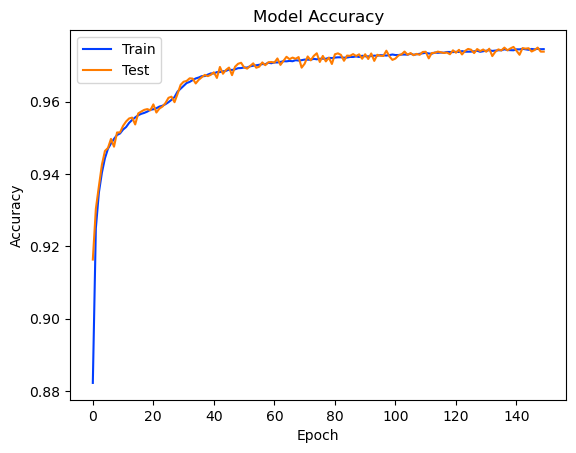

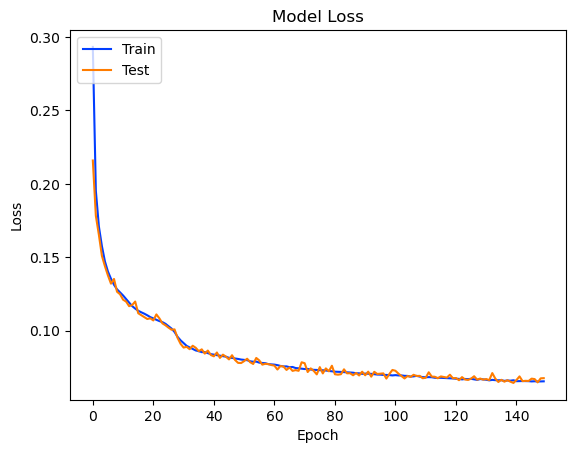

8068/8068 [==============================] - 6s 766us/step


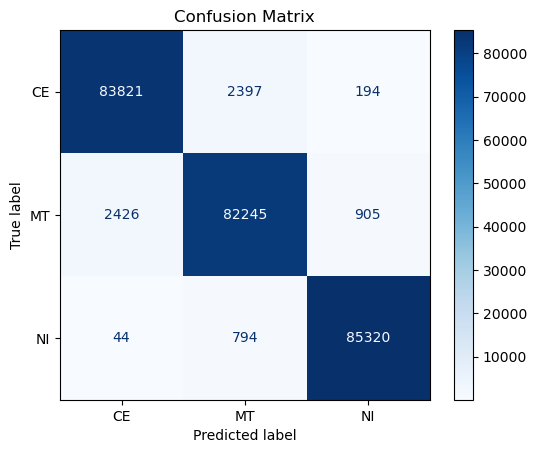

Classification Report:
              precision    recall  f1-score   support

          CE       0.97      0.97      0.97     86412
          MT       0.96      0.96      0.96     85576
          NI       0.99      0.99      0.99     86158

    accuracy                           0.97    258146
   macro avg       0.97      0.97      0.97    258146
weighted avg       0.97      0.97      0.97    258146



INFO:tensorflow:Assets written to: ./dnn_model.model/assets


INFO:tensorflow:Assets written to: ./dnn_model.model/assets


CPU times: user 10min 34s, sys: 1min 9s, total: 11min 44s
Wall time: 6min 4s


In [162]:
%%time

import keras

class PrintProgressCallback(keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        if epoch % 10 == 0:
            print(f"Epoch {epoch+1}/{self.params['epochs']}")
            print(f" - loss: {logs['loss']:.4f} - accuracy: {logs['accuracy']:.4f} - val_loss: {logs['val_loss']:.4f} - val_accuracy: {logs['val_accuracy']:.4f}")

## Define the neural network model
def create_model(num_layers=4, num_neurons=20, optimizer='adam'):
    model = keras.models.Sequential()
    model.add(keras.layers.Dense(num_neurons, activation='relu', input_shape=(6,)))
    #model.add(keras.layers.Dropout(0.001))
    for _ in range(num_layers-1):
        model.add(keras.layers.Dense(num_neurons, activation='relu'))
    
    model.add(keras.layers.Dense(num_classes, activation='sigmoid'))
    
    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
    
    return model

# Create the final model with the best hyperparameters
final_model = create_model(num_neurons=20, optimizer='adam')

# Train the final model
final_model.fit(X_train, y_train, epochs=150, batch_size=750, validation_data=(X_test, y_test), callbacks=[PrintProgressCallback()], verbose=0)

# Plot accuracy over each epoch
plt.plot(final_model.history.history['accuracy'])
plt.plot(final_model.history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

plt.plot(final_model.history.history['loss'])
plt.plot(final_model.history.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

# Evaluate the final model on the test data
y_pred = final_model.predict(X_test)
y_pred_labels = np.argmax(y_pred, axis=1)
y_test_labels = np.argmax(y_test, axis=1)

# Plot the confusion matrix
cm = confusion_matrix(y_test_labels, y_pred_labels)
classes = label_encoder.classes_
display = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)
display.plot(cmap='Blues')
plt.title("Confusion Matrix")
plt.show()

# Print classification report
target_names = label_encoder.classes_
classification_rep = classification_report(y_test_labels, y_pred_labels, target_names=target_names)
print("Classification Report:")
print(classification_rep)

model_path = './dnn_model.model'
final_model.save(model_path)

### SHAP explainer <a class="anchor" id="shap_dnn_all"></a>

[(To T.O.C.)](#toc)

[SHAP](https://shap.readthedocs.io/en/latest/) (SHapley Additive exPlanations) values are a method used to explain the predictions of machine learning models. They were introduced by [Lundberg and Lee in 2017](https://papers.nips.cc/paper_files/paper/2017/file/8a20a8621978632d76c43dfd28b67767-Paper.pdf) and are based on cooperative game theory.

SHAP values provide a way to allocate the contribution of each feature in a prediction model to the final prediction. They aim to quantify the impact of each feature on the prediction outcome by considering all possible combinations of features and calculating the contribution of each feature in each combination.

The core idea behind SHAP values is the concept of [Shapley values](https://en.wikipedia.org/wiki/Shapley_value), which is a method for fairly distributing the payout of a cooperative game among the players based on their individual contributions. In the context of machine learning models, the features are treated as players, and the prediction outcome is the payout.

To calculate SHAP values, a baseline reference is established, which serves as a starting point for the feature contributions. Then, different combinations of features are created, and for each combination, the model predictions are observed. The contribution of each feature is determined by comparing the predictions with and without the feature included.

SHAP values provide several advantages in interpreting machine learning models. They offer a unified framework for feature importance measurement that is both consistent and locally accurate. They also satisfy desirable properties such as consistency, meaning that if a feature is removed or added, the SHAP values change accordingly. Furthermore, SHAP values can be used to explain individual predictions as well as provide an overview of feature importance across the entire dataset.

In our study, we employed three types of visualizations to gain insights into the importance of each feature\*.
#### Summary plot (bar type) for global inspection
This kind of plot examine the mean absolute SHAP value for each feature across all of the data. This quantifies, on average, the magnitude of each feature's contribution towards the predicted label. If a feature has a high mean SHAP value, it suggests that it generally has a strong influence on the predictions. Conversely, a low mean SHAP value indicates that the feature has less impact on the model's predictions. Mean absolute SHAP values are essentially a drop-in replacement for more traditional feature importance measures but have two key advantages:

- Mean absolute SHAP values are more theoretically rigorous, and relate to which features impact predictions most. Conventional feature importances are measured in more abstract and algorithm-specific ways, and are determined by how much each feature improves the model's predictive performance.
- Mean absolute SHAP values have intuitive units, like the target variable. Feature importances are often expressed in counterintuitive units based on complex concepts such as tree algorithm node impurities.

The features are presented in descending order of importance, with the most significant feature listed at the top and the less significant features listed towards the bottom.

#### Summary plot (bar type) for labels inspection
We created separate plots for each label to gain a more accurate understanding of the feature importance. By examining the importance of features for each label individually, we obtained specific insights into their contributions to the prediction accuracy for each class.

#### Summary plot (violin type) for each label (evolution channel)
This is the most useful type of plot for our study.
A SHAP violin plot provides a visual representation of the distribution of SHAP values for different features in the model. It helps in understanding the impact of each feature on the model's predictions.

- Vertical Axis: The vertical axis represents the features in the model. The features are presented in descending order of importance.

- Horizontal Axis: The horizontal axis represents the range of SHAP values. It spans from negative to positive values, indicating the direction and magnitude of the feature's influence on the predictions.

- Violin Shape: Each violin-shaped distribution represents the density of the SHAP values for a specific feature. The width of the violin at a given point represents the density or frequency of SHAP values at that point.

   - A wider section of the violin indicates a higher density of SHAP values, indicating a stronger influence of the feature on the predictions.
   - A narrower section of the violin indicates a lower density of SHAP values, suggesting a weaker influence.
- Original value: Color shows whether that variable is high (in red) or low (in blue) for that observation.

The SHAP violin plot allows you to compare the distributions of SHAP values across different features. It helps identify features that have consistent and impactful contributions (wider violins with higher densities) and those that have less influence (narrower violins with lower densities).

The plot can also reveal features with bimodal or asymmetric distributions, indicating the presence of different subgroups or distinct patterns in the data that affect the predictions differently.

\* ref1: https://www.aidancooper.co.uk/a-non-technical-guide-to-interpreting-shap-analyses/  
\* ref2: https://medium.com/dataman-in-ai/explain-your-model-with-the-shap-values-bc36aac4de3d

In [164]:
%%time
model_path = './dnn_model.model'

model = keras.models.load_model(model_path)

import shap

'''
# Convert the input data to a NumPy array
X_test_array = X_test.values

# Create a random sample of background data
background_sample_size = 1000
background_sample_indices = np.random.choice(X_train.shape[0], background_sample_size, replace=False)
background_sample = X_train.iloc[background_sample_indices].values
'''
# Create an explainer using the model and data
explainer = shap.DeepExplainer(final_model, X_train.values)

# Compute the SHAP values
shap_values = explainer.shap_values(X_test[:150].values)

keras is no longer supported, please use tf.keras instead.
Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.
You have provided over 5k background samples! For better performance consider using smaller random sample.
`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.


CPU times: user 3h 31min 17s, sys: 13h 35s, total: 16h 31min 53s
Wall time: 19min 12s


### Summary plot (bar type) for global inspection

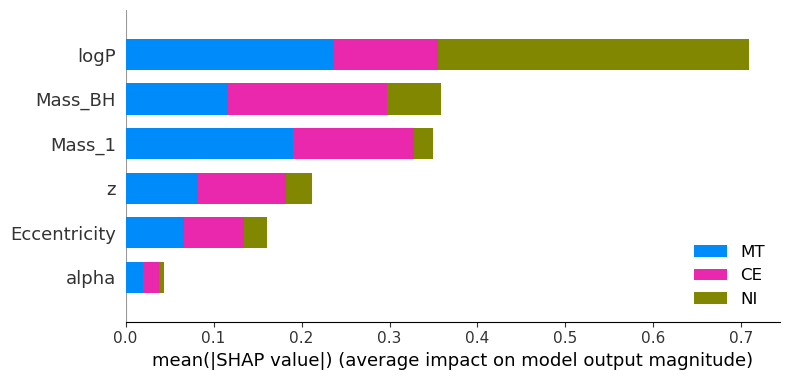

In [165]:
shap.summary_plot(shap_values, X_test[:150], plot_type="bar", class_names=['CE', 'MT', 'NI'])

In [166]:
label_names = label_encoder.classes_
shap_values_avg = np.mean(shap_values, axis=0)
for i, label_name in enumerate(label_names):
    shap_value = shap_values_avg[i]
    print(f"Class: {label_name}, SHAP Value: {shap_value}")


Class: CE, SHAP Value: [ 0.0387551   0.0791984  -0.01071234  0.06877016  0.02881983  0.00254454]
Class: MT, SHAP Value: [ 0.0490719  -0.0553476   0.01058147  0.03533336 -0.01094399  0.01555953]
Class: NI, SHAP Value: [-0.05314749 -0.01304197  0.01275025  0.02293252 -0.00776862 -0.00102865]


### Summary plot (bar type) for labels inspection

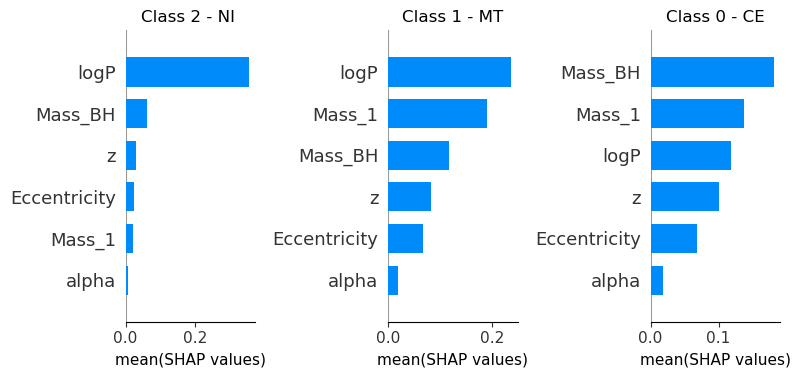

In [167]:
fig = plt.figure(figsize=(20,10))

ax0 = fig.add_subplot(131)
ax0.title.set_text('Class 2 - NI ')
shap.summary_plot(shap_values[2], X_test[:150], plot_type="bar", show=False)
ax0.set_xlabel(r'mean(SHAP values)', fontsize=11)
plt.subplots_adjust(wspace = 5)

ax1 = fig.add_subplot(132)
ax1.title.set_text('Class 1 - MT')
shap.summary_plot(shap_values[1], X_test[:150], plot_type="bar", show=False)
plt.subplots_adjust(wspace = 5)
ax1.set_xlabel(r'mean(SHAP values)', fontsize=11)

ax2 = fig.add_subplot(133)
ax2.title.set_text('Class 0 - CE')
shap.summary_plot(shap_values[0], X_test[:150], plot_type="bar", show=False)
ax2.set_xlabel(r'mean(SHAP values)', fontsize=11)

# plt.tight_layout(pad=3) # You can also use plt.tight_layout() instead of using plt.subplots_adjust() to add space between plots
plt.show()

### Summary plot (violin type) for each label (evolution channel)

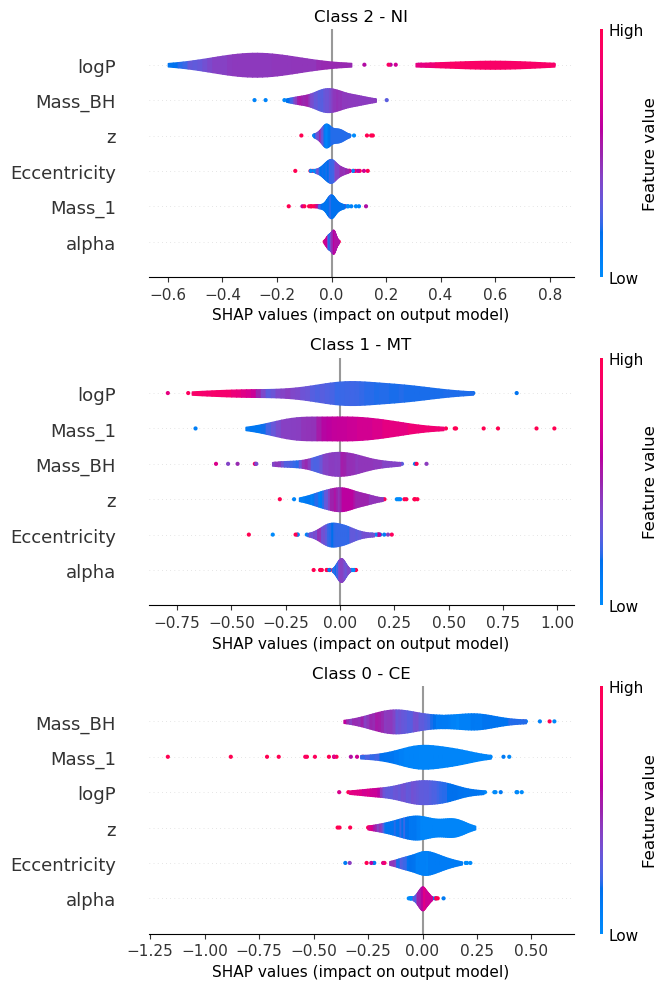

In [168]:
fig = plt.figure()

ax0 = fig.add_subplot(311)
ax0.set_title('Class 2 - NI')
shap.summary_plot(shap_values[2], X_test[:150], plot_type='violin', show=False)
ax0.set_xlabel('SHAP values (impact on output model)', fontsize=11)



ax1 = fig.add_subplot(312)
ax1.set_title('Class 1 - MT')
shap.summary_plot(shap_values[1], X_test[:150], plot_type='violin', show=False)
ax1.set_xlabel('SHAP values (impact on output model)', fontsize=11)


ax2 = fig.add_subplot(313)
plt.title('Class 0 - CE')
shap.summary_plot(shap_values[0], X_test[:150], plot_type='violin', show=False)
plt.xlabel('SHAP values (impact on output model)', fontsize=11)

plt.subplots_adjust(hspace = 50)
plt.gcf().set_size_inches(7,10)
plt.tight_layout()
plt.show()


In this section we try to give an astrophysical interpretation to the results illustrated by the plot above.

- **Non-Interacting (NI)**:
    - `logP` (Period): High values of the period contribute greatly. This is because systems that have never interacted, and therefore have not developed orbital energy dissipation mechanisms, are characterized by very long periods. 
    - `Mass_BH`: Intermediate mass values appear to be favored. This preference can be attributed to the fact that stars, which subsequently underwent to the process of evolving into BHs, and have not interacted with the companions, retain higher mass values. Consequently, these stars evolve into BHs with greater mass compared to systems involving interactions with companions.
    - `z`: Based on observations of stellar tracks, it is evident that stars with higher metallicities (e.g., z=0.02) tend to exhibit a more pronounced expansion phase at the onset of helium-burning compared to stars with lower metallicities. At the same MZAMS, these stars demonstrate a propensity to attain larger radii more rapidly. Consequently, such stars are more susceptible to exceeding their Roche lobes, initiating a mass transfer process. Thus, according to the above, the model should show a preference for low-medium values (e.g. z=0.001, z=0.0001) of metallicity regarding systems categorized as non-interacting, while high values for systems that are evolved via mass transfer or common envelope. In the context of this label, the influence of metallicity on label selection lacks definitive evidence. Nevertheless, it is consistent with theoretical expectations that lower metallicity values are favored.
    - `Eccentricity`: Medium to high values of eccentricity contribute slightly to label NI. The reason is related to the fact that they did not dissipate orbital energy and thus did not circularize the orbit.
    - `Mass_1`: It seems not contribute to labeling.
    - `alpha`: It seems not contribute to labeling.  

------------------------------------------------

- **(stable) Mass Transfer (MT)**:
    - `logP` (Period): Low period values contribute significantly because, through mass transfer mechanisms, the systems dissipated orbital energy by shortening the period.
    - `Mass_1` & `Mass_BH`: When a RLO happens, it changes the mass ratio, the masses and semi-major axis of the binary system. As a consequence, the RL shrinks or expands. If the RL shrinks faster than the donor's radius (or if the RL expands more slowly than the donor's radius) because of the adiabatic response of the star to mass loss, the mass transfer becomes unstable on a dynamical timescale, leading to a stellar merger or a CE configuration. 
    Population synthesis codes usually implement a simplified formalism in which the mass transfer stability is evaluated by comparing the mass ratio $q=M_d/M_a$ (where $M_d$ and $M_a$ are the mass of the donor, in our case most of the time the objects that became a BH, and accretor star, respectively, with some critical value $q_c$. If the mass ratio is larger than $q_c$, the mass transfer is considered unstable on a dynamical time scale. The critical mass ratio is usually assumed to be large (> 2) for stars with radiative envelopes (e.g., MS stars, stars in the Hertzsprung-gap phase, and pure-He stars). If the RL is smaller than the core radius of the donor star, the mass transfer is always considered unstable, ignoring the chosen stability criterion. If both stars have radius $R \ge RL$, we assume that the evolution leads either to a CE (when at least one of the two stars has a clear core-envelope separation) or to a stellar merger ([Iorio et al., 2022](https://arxiv.org/pdf/2211.11774.pdf)).
    Following this introduction, we can now delve into an explanation for why medium to high mass values are generally preferred. During their star-star evolutionary phase, it is likely that the mass ratio of the two objects was below $q_c$. Consequently, the information about $q$ is expected to have influenced the mass values in the BH-MS phase, playing a significant role in determining the classification of the system as a stable mass transfer (MT) system. It should be noted that it is not crystal clear whether the model has really identified what the importance of astrophysically correct values is in assigning this label.
    - `z`: As stated previously, high metallicity values contribute to an amplified likelihood of a star undergoing mass transfer episodes.
    - `Eccentricity`: Slight contribution given by intermediate values of eccentricity.
    - `alpha`: It seems not contribute to labeling. 
    
------------------------------------------
      
- **(at least one) Common Envelope (CE)**:
    - `Mass_BH` & `Mass_1`: Based on the previous information, it is possible to think the mass ratio during the star-star phase was above the critical value $q_c$, indicating the occurrence of at least one common envelope (CE) phase in the system's evolution. However, it should be noted that it is not crystal clear whether the model has really identified what the importance of astrophysically correct values is in assigning this label.
    In order to enhance the model's understanding and recognition of the threshold ($q_c$) described above, one potential avenue for improvement in future iterations is the inclusion of additional training data. This could involve incorporating information regarding the initial mass ratio of the binary system, or the mass ration in each phase experienced by the donor star.
    In our training experiments, we found that including the mass ratio of the BH-MS system as a feature led to a notable decrease of at least 10 percentage points in the model's accuracy. Therefore, we decided to exclude this feature to prioritize higher accuracy in the categorization process.
    - `logP` (Period) & `Eccentricity`: Low values of period and eccentricity contribute greatly. Through one or more common envelopes the system interacts and loses orbital energy resulting in period reduction and circularization of the orbit.
    - `z`: This feature interpretation seems to be inconsistent from an astrophysical point of view.
    - `alpha`: It seems not contribute to labeling.

## DNN model for Classification of candidates <a class="anchor" id="dnn_restr"></a>

[(To T.O.C.)](#toc)

In order to effectively classify the dataset containing candidate BH+MS systems, it is imperative to train the model using the exact features present in that particular dataset. These features include `Mass_BH`, `Mass_1`, and `logP`. It is crucial to note that these features have been appropriately scaled, just as in the previous model, to ensure consistency and enhance the training process.

The overall structure of the DNN employed for this classification task remains largely unchanged. However, a notable addition has been made by incorporating a dropout layer after each hidden layer, excluding the input and output layers. Dropout layers are implemented to prevent overfitting and improve the generalization capability of the model. By introducing dropout, the DNN becomes more resilient and less prone to relying too heavily on specific neurons or features during training.

During the application of GridSearchCV, we observed that the optimal number of epochs falls within the range of 100 to 200 epochs. Based on these findings, we decided to set the number of epochs to 150. The batch size value of 1000 was selected for computational efficiency purposes during the training of the model, as it has been observed to have no significant impact on the accuracy of the model. These parameter values were determined to strike a balance between model performance and computational efficiency.

**We observed that the `NI` label is accurately recognized in over 97% of cases, while the other two labels are recognized around 88% of the cases. The overall accuracy of the model is around 91%**. The lower accuracy can likely be attributed to the fact that the model is trained on only three features, which may not provide enough information to capture the complex patterns and relationships in the data accurately.

In [4]:
%%time

## preprocessing the data to put inside the DNN

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix, classification_report
from tensorflow import keras
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import ConfusionMatrixDisplay
from keras.callbacks import ProgbarLogger

# Load the dataset
data = shuffle_data

# Separate the features and labels
X = data[['Mass_BH', 'Mass_1', 'logP']]
y = data['type']

selected_columns = ['Mass_BH', 'Mass_1', 'logP']
scaler = StandardScaler()
X[selected_columns] = scaler.fit_transform(X[selected_columns])

# Perform label encoding on the labels
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Convert labels to categorical one-hot encoding
num_classes = len(label_encoder.classes_)
y_train = keras.utils.to_categorical(y_train, num_classes)
y_test = keras.utils.to_categorical(y_test, num_classes)

2023-07-13 13:32:16.895164: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-07-13 13:32:16.963699: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-07-13 13:32:16.964322: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-07-13 13:32:18.074552: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
<timed exec>:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-

CPU times: user 2.84 s, sys: 426 ms, total: 3.27 s
Wall time: 3.26 s


2023-07-13 13:32:20.599309: W tensorflow/core/common_runtime/gpu/gpu_device.cc:1956] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


Epoch 1/150
 - loss: 0.3170 - accuracy: 0.8745 - val_loss: 0.2602 - val_accuracy: 0.8949
Epoch 11/150
 - loss: 0.2338 - accuracy: 0.9029 - val_loss: 0.2262 - val_accuracy: 0.9056
Epoch 21/150
 - loss: 0.2282 - accuracy: 0.9045 - val_loss: 0.2217 - val_accuracy: 0.9074
Epoch 31/150
 - loss: 0.2251 - accuracy: 0.9055 - val_loss: 0.2192 - val_accuracy: 0.9076
Epoch 41/150
 - loss: 0.2231 - accuracy: 0.9062 - val_loss: 0.2175 - val_accuracy: 0.9084
Epoch 51/150
 - loss: 0.2217 - accuracy: 0.9068 - val_loss: 0.2164 - val_accuracy: 0.9087
Epoch 61/150
 - loss: 0.2203 - accuracy: 0.9073 - val_loss: 0.2148 - val_accuracy: 0.9098
Epoch 71/150
 - loss: 0.2193 - accuracy: 0.9076 - val_loss: 0.2148 - val_accuracy: 0.9096
Epoch 81/150
 - loss: 0.2188 - accuracy: 0.9079 - val_loss: 0.2133 - val_accuracy: 0.9100
Epoch 91/150
 - loss: 0.2180 - accuracy: 0.9082 - val_loss: 0.2137 - val_accuracy: 0.9095
Epoch 101/150
 - loss: 0.2176 - accuracy: 0.9084 - val_loss: 0.2128 - val_accuracy: 0.9107
Epoch 111/

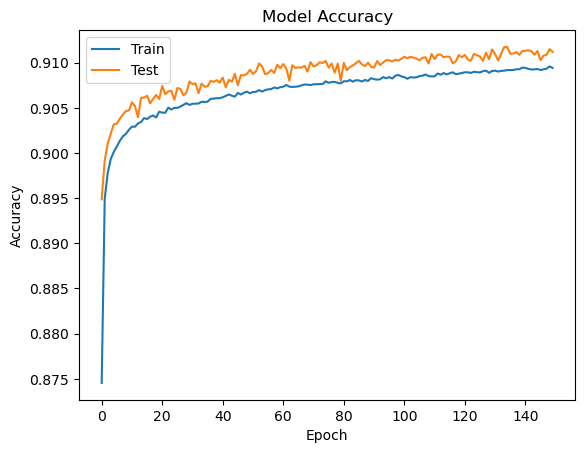

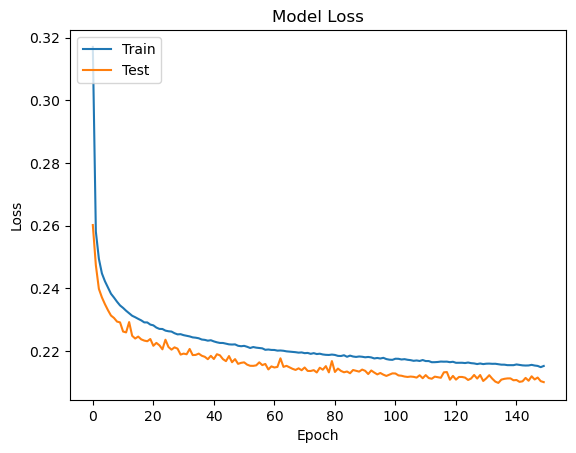

8068/8068 [==============================] - 6s 695us/step


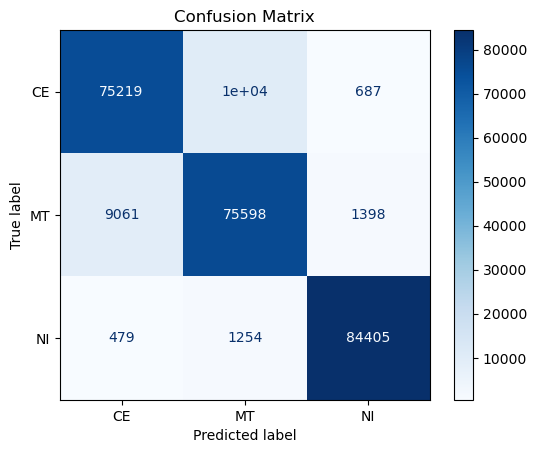

Classification Report:
              precision    recall  f1-score   support

          CE       0.89      0.88      0.88     85951
          MT       0.87      0.88      0.87     86057
          NI       0.98      0.98      0.98     86138

    accuracy                           0.91    258146
   macro avg       0.91      0.91      0.91    258146
weighted avg       0.91      0.91      0.91    258146

CPU times: user 20min 55s, sys: 2min 51s, total: 23min 47s
Wall time: 10min 1s


In [5]:
%%time

import keras

class PrintProgressCallback(keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        if epoch % 10 == 0:
            print(f"Epoch {epoch+1}/{self.params['epochs']}")
            print(f" - loss: {logs['loss']:.4f} - accuracy: {logs['accuracy']:.4f} - val_loss: {logs['val_loss']:.4f} - val_accuracy: {logs['val_accuracy']:.4f}")

## Define the neural network model
def create_model(dropout_rate=0.01, num_layers=4, num_neurons=32, optimizer='adam'):
    model = keras.models.Sequential()
    model.add(keras.layers.Dense(num_neurons, activation='relu', input_shape=(3,)))
    #model.add(keras.layers.Dropout(dropout_rate))
    for _ in range(num_layers-1):
        model.add(keras.layers.Dense(num_neurons, activation='relu'))
        model.add(keras.layers.Dropout(dropout_rate))
    
    model.add(keras.layers.Dense(num_classes, activation='sigmoid'))
    
    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
    
    return model

# Create the final model with the best hyperparameters
final_model = create_model(num_neurons=32, optimizer='adam')

# Train the final model
final_model.fit(X_train, y_train, epochs=150, batch_size=1000, validation_data=(X_test, y_test), callbacks=[PrintProgressCallback()], verbose=0)

# Plot accuracy over each epoch
plt.plot(final_model.history.history['accuracy'])
plt.plot(final_model.history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

plt.plot(final_model.history.history['loss'])
plt.plot(final_model.history.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

# Evaluate the final model on the test data
y_pred = final_model.predict(X_test)
y_pred_labels = np.argmax(y_pred, axis=1)
y_test_labels = np.argmax(y_test, axis=1)

# Plot the confusion matrix
cm = confusion_matrix(y_test_labels, y_pred_labels)
classes = label_encoder.classes_
display = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)
display.plot(cmap='Blues')
plt.title("Confusion Matrix")
plt.show()

# Print classification report
target_names = label_encoder.classes_
classification_rep = classification_report(y_test_labels, y_pred_labels, target_names=target_names)
print("Classification Report:")
print(classification_rep)

model_path = './dnn_candidates_model.keras'
final_model.save(model_path)

### SHAP explainer <a class="anchor" id="shap_dnn_all"></a>

[SHAP explainer](#shap_dnn_all)

[(To T.O.C.)](#toc)

In [175]:
%%time

import shap
import keras
model_path = './dnn_candidates_model.model'

model = keras.models.load_model(model_path)

'''
# Convert the input data to a NumPy array
X_test_array = X_test.values

# Create a random sample of background data
background_sample_size = 1000
background_sample_indices = np.random.choice(X_train.shape[0], background_sample_size, replace=False)
background_sample = X_train.iloc[background_sample_indices].values
'''
# Create an explainer using the model and data
explainer = shap.DeepExplainer(model, X_train.values)

# Compute the SHAP values
shap_values = explainer.shap_values(X_test[:150].values)

Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.
You have provided over 5k background samples! For better performance consider using smaller random sample.
`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.


CPU times: user 6h 50min 8s, sys: 18h 29min 56s, total: 1d 1h 20min 5s
Wall time: 24min 22s


### Summary plot (bar type) for global inspection

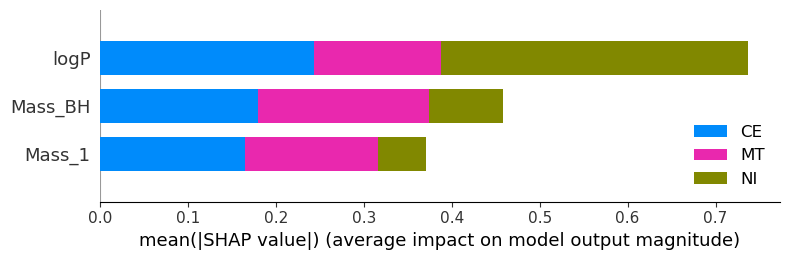

In [176]:
shap.summary_plot(shap_values, X_test[:150], plot_type="bar", class_names=['CE', 'MT', 'NI'])

### Summary plot (bar type) for labels inspection

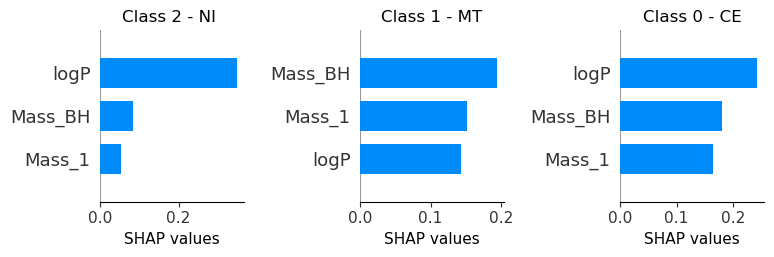

In [177]:
fig = plt.figure(figsize=(20,10))

ax0 = fig.add_subplot(131)
ax0.title.set_text('Class 2 - NI ')
shap.summary_plot(shap_values[2], X_test[:150], plot_type="bar", show=False)
ax0.set_xlabel(r'SHAP values', fontsize=11)
plt.subplots_adjust(wspace = 5)

ax1 = fig.add_subplot(132)
ax1.title.set_text('Class 1 - MT')
shap.summary_plot(shap_values[1], X_test[:150], plot_type="bar", show=False)
plt.subplots_adjust(wspace = 5)
ax1.set_xlabel(r'SHAP values', fontsize=11)

ax2 = fig.add_subplot(133)
ax2.title.set_text('Class 0 - CE')
shap.summary_plot(shap_values[0], X_test[:150], plot_type="bar", show=False)
ax2.set_xlabel(r'SHAP values', fontsize=11)

# plt.tight_layout(pad=3) # You can also use plt.tight_layout() instead of using plt.subplots_adjust() to add space between plots
plt.show()

-------------------------
-------------------------

## Different classifier - test the performance <a class="anchor" id="diff_class"></a>

[(To T.O.C.)](#toc)

In addition to employing a DNN, we conducted experiments using various [classification algorithms](https://scikit-learn.org/stable/supervised_learning.html) in their default configurations. These algorithms were evaluated and ranked based on their performance metrics, including Accuracy, Precision, Recall, and F1-Score.

The results indicate that RandomForestClassifier, BaggingClassifier, ExtraTreesClassifier, DecisionTreeClassifier, and XGBClassifier demonstrated similar performances. Notably, all of these algorithms are based on the principles of decision trees and ensemble methods. After careful consideration, we have chosen to utilize **XGBoost** due to its distinctive features:

- Sequential Ensemble Building: XGBoost constructs an ensemble of weak decision tree models in a sequential manner. Each subsequent model is designed to rectify the errors made by the preceding models, thereby improving the overall predictive capability;

- Gradient Boosting Framework: XGBoost employs a gradient boosting framework, which involves iteratively optimizing a specific objective function to enhance the model's performance. By minimizing the objective function, XGBoost actively seeks the best possible model fit;

- High Predictive Power and Efficiency: XGBoost is renowned for its exceptional predictive power. Moreover, XGBoost is designed to optimize computational efficiency, enabling it to handle large datasets and complex problems effectively.

In [6]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import AdaBoostClassifier
from xgboost import XGBClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.svm import SVC
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.preprocessing import StandardScaler


# Load the dataset
data = shuffle_data

# Separate the features and labels
X = data[['Mass_BH', 'Mass_1', 'logP', 'Eccentricity', 'z', 'alpha']]
y = data['type']

selected_columns = ['Mass_BH', 'Mass_1', 'logP', 'Eccentricity']
scaler = StandardScaler()
X[selected_columns] = scaler.fit_transform(X[selected_columns])

# Perform label encoding on the labels
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define a list of classifiers
classifiers = [
    DecisionTreeClassifier(),
    RandomForestClassifier(),
    KNeighborsClassifier(),
    GaussianNB(),
    LogisticRegression(),
    GradientBoostingClassifier(),
    AdaBoostClassifier(),
    XGBClassifier(),
    ExtraTreesClassifier(),
    BaggingClassifier()
]

# Create empty lists to store evaluation metrics
accuracy_scores = []
precision_scores = []
recall_scores = []
f1_scores = []

# Train and evaluate each classifier
for classifier in classifiers:
    classifier_name = classifier.__class__.__name__
    classifier.fit(X_train, y_train)
    y_pred = classifier.predict(X_test)
    
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    
    accuracy_scores.append(accuracy)
    precision_scores.append(precision)
    recall_scores.append(recall)
    f1_scores.append(f1)
    
    # Print evaluation metrics
    print(f"Classifier: {classifier_name}")
    print(f"Accuracy: {accuracy:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"F1-Score: {f1:.4f}")
    print("----------------------------------")

/tmp/ipykernel_198926/921893021.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X[selected_columns] = scaler.fit_transform(X[selected_columns])


Classifier: DecisionTreeClassifier
Accuracy: 0.9794
Precision: 0.9795
Recall: 0.9794
F1-Score: 0.9795
----------------------------------
Classifier: RandomForestClassifier
Accuracy: 0.9853
Precision: 0.9853
Recall: 0.9853
F1-Score: 0.9853
----------------------------------
Classifier: KNeighborsClassifier
Accuracy: 0.9546
Precision: 0.9547
Recall: 0.9546
F1-Score: 0.9547
----------------------------------
Classifier: GaussianNB
Accuracy: 0.7835
Precision: 0.7925
Recall: 0.7835
F1-Score: 0.7782
----------------------------------
Classifier: LogisticRegression
Accuracy: 0.8353
Precision: 0.8351
Recall: 0.8353
F1-Score: 0.8346
----------------------------------
Classifier: GradientBoostingClassifier
Accuracy: 0.9501
Precision: 0.9501
Recall: 0.9501
F1-Score: 0.9501
----------------------------------
Classifier: AdaBoostClassifier
Accuracy: 0.8344
Precision: 0.8360
Recall: 0.8344
F1-Score: 0.8325
----------------------------------
Classifier: XGBClassifier
Accuracy: 0.9790
Precision: 0.979

Best Performing Algorithm (Accuracy): RandomForestClassifier
Best Performing Algorithm (Precision): RandomForestClassifier
Best Performing Algorithm (Recall): RandomForestClassifier
Best Performing Algorithm (F1-Score): RandomForestClassifier


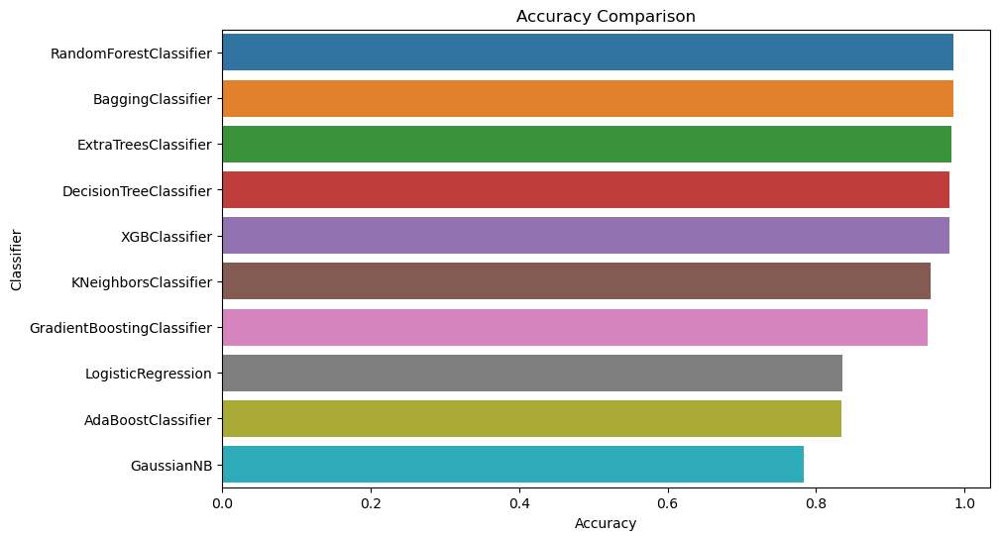

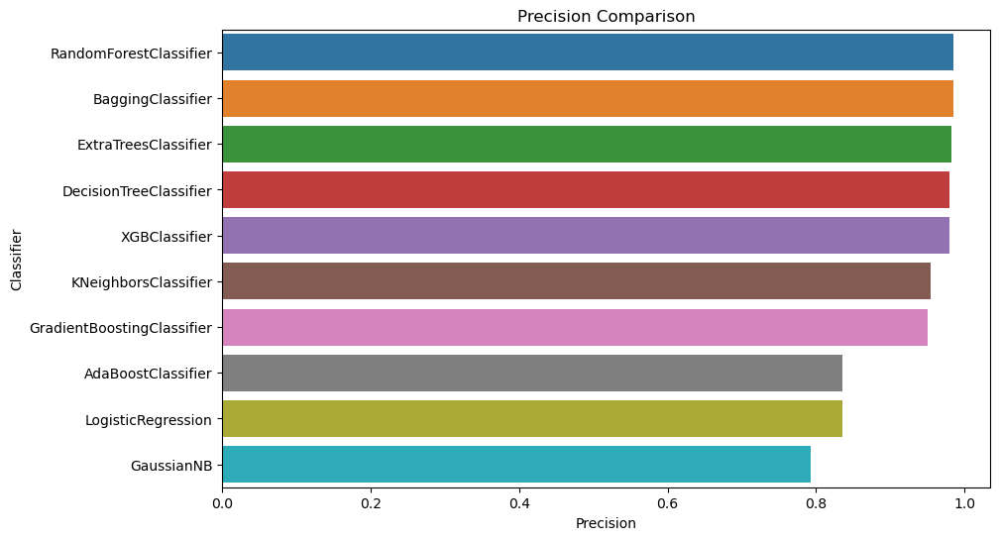

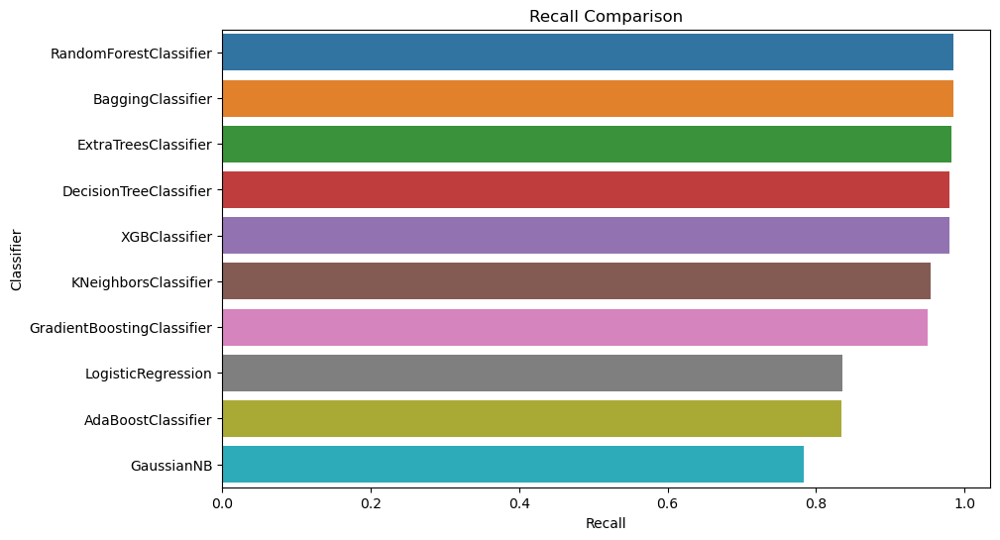

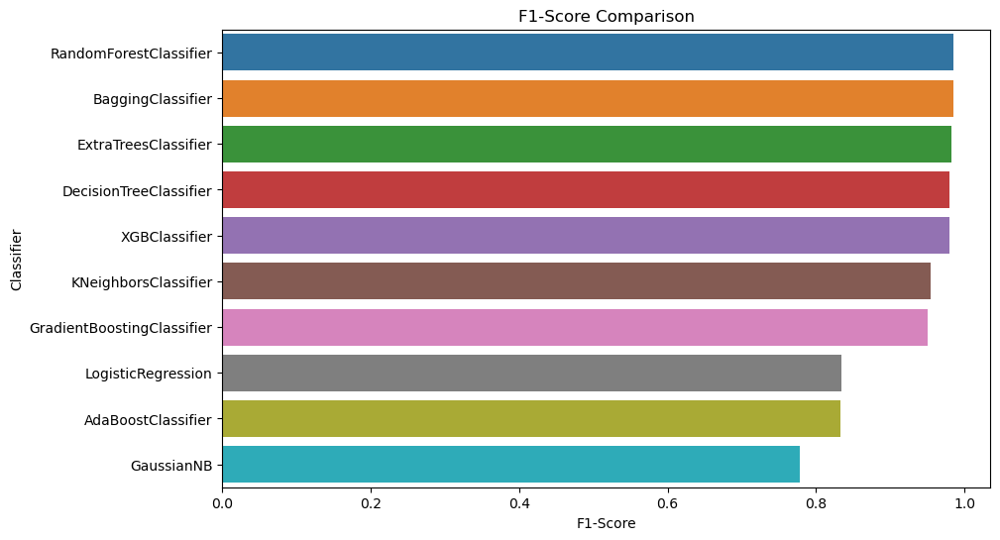

In [7]:
# Create a DataFrame to compare the performance of each classifier
results_df = pd.DataFrame({
    'Classifier': [classifier.__class__.__name__ for classifier in classifiers],
    'Accuracy': accuracy_scores,
    'Precision': precision_scores,
    'Recall': recall_scores,
    'F1-Score': f1_scores
})

# Plot comparison for Accuracy
plt.figure(figsize=(10, 6))
sn.barplot(x='Accuracy', y='Classifier', data=results_df.sort_values(by='Accuracy', ascending=False))
plt.title("Accuracy Comparison")
plt.xlabel("Accuracy")
plt.ylabel("Classifier")

# Plot comparison for Precision
plt.figure(figsize=(10, 6))
sn.barplot(x='Precision', y='Classifier', data=results_df.sort_values(by='Precision', ascending=False))
plt.title("Precision Comparison")
plt.xlabel("Precision")
plt.ylabel("Classifier")

# Plot comparison for Recall
plt.figure(figsize=(10, 6))
sn.barplot(x='Recall', y='Classifier', data=results_df.sort_values(by='Recall', ascending=False))
plt.title("Recall Comparison")
plt.xlabel("Recall")
plt.ylabel("Classifier")

# Plot comparison for F1-Score
plt.figure(figsize=(10, 6))
sn.barplot(x='F1-Score', y='Classifier', data=results_df.sort_values(by='F1-Score', ascending=False))
plt.title("F1-Score Comparison")
plt.xlabel("F1-Score")
plt.ylabel("Classifier")

# Find the best performing algorithm based on the metrics
best_accuracy_classifier = results_df.loc[results_df['Accuracy'].idxmax()]['Classifier']
best_precision_classifier = results_df.loc[results_df['Precision'].idxmax()]['Classifier']
best_recall_classifier = results_df.loc[results_df['Recall'].idxmax()]['Classifier']
best_f1_score_classifier = results_df.loc[results_df['F1-Score'].idxmax()]['Classifier']

print(f"Best Performing Algorithm (Accuracy): {best_accuracy_classifier}")
print(f"Best Performing Algorithm (Precision): {best_precision_classifier}")
print(f"Best Performing Algorithm (Recall): {best_recall_classifier}")
print(f"Best Performing Algorithm (F1-Score): {best_f1_score_classifier}")


# XGBoost <a class="anchor" id="xgb"></a>

[(To T.O.C.)](#toc)

[XGBoost](https://en.wikipedia.org/wiki/XGBoost), short for eXtreme Gradient Boosting, is a powerful algorithm used for supervised learning tasks, particularly classification problems. It is an ensemble learning method that combines weak predictive models, usually decision trees, to create a strong predictive model.

The [algorithm](https://xgboost.readthedocs.io/en/stable/) works by iteratively training and adding decision trees to the ensemble. During each iteration, it identifies the areas where the previous trees have made errors and focuses on correcting those errors in the subsequent trees. This iterative process, known as gradient boosting, helps improve the model's accuracy.
XGBoost starts with an initial weak predictive model and then constructs new trees that minimize the loss function by learning from the gradients of the errors. The predictions from all the trees are combined to make a final prediction.
The algorithm continues to add trees and refine the model's predictions until a stopping criterion is met. Once the training is complete, XGBoost produces a final prediction by aggregating the predictions from all the trees.

XGBoost is popular due to its ability to handle complex relationships between features and its efficiency in processing large datasets.

# XGBoost model with all the features<a class="anchor" id="xgb_all"></a>

[(To T.O.C.)](#toc)

After conducting a GridSearchCV analysis on multiple hyperparameters, our findings reveal that the default XGBoost model consistently outperforms other models when considering all available input features.

**The model performs incredibly well, achieving accuracy rates of over 97% for all three labels and an overall accuracy of more than 98%**.

<timed exec>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Accuracy: 0.979038993437822
Precision: 0.9790641302747958
Recall: 0.979038993437822
F1-Score: 0.9790338071672348


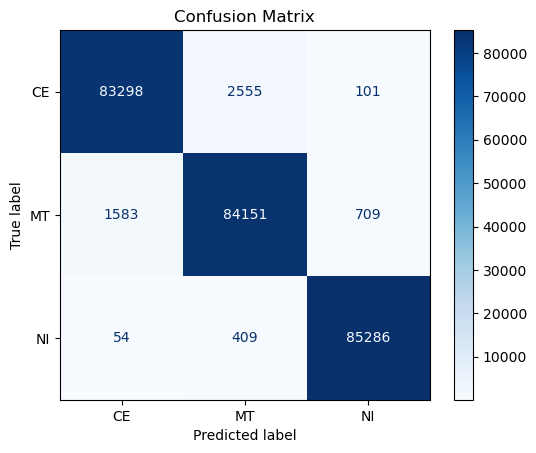

Classification Report:
              precision    recall  f1-score   support

          CE       0.98      0.97      0.97     85954
          MT       0.97      0.97      0.97     86443
          NI       0.99      0.99      0.99     85749

    accuracy                           0.98    258146
   macro avg       0.98      0.98      0.98    258146
weighted avg       0.98      0.98      0.98    258146

CPU times: user 25min 9s, sys: 39.3 s, total: 25min 49s
Wall time: 2min 35s


In [9]:
%%time

import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from xgboost import XGBClassifier
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import confusion_matrix, classification_report

# Load the dataset
data = shuffle_data

# Separate the features and labels
X = data[['Mass_BH', 'Mass_1', 'Eccentricity', 'logP', 'z', 'alpha']]
y = data['type']

selected_columns = ['Mass_BH', 'Mass_1', 'Eccentricity', 'logP']
scaler = StandardScaler()
X[selected_columns] = scaler.fit_transform(X[selected_columns])

# Perform label encoding on the labels
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create and train the XGBoost classifier
xgb_classifier = XGBClassifier(n_jobs=10)
xgb_classifier.fit(X_train, y_train)

# Predict on the validation set
y_pred = xgb_classifier.predict(X_test)

# Calculate and print the evaluation scores
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1-Score:", f1)

# Plot the confusion matrix
cm = confusion_matrix(y_test, y_pred)
classes = label_encoder.classes_
display = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)
display.plot(cmap='Blues')
plt.title("Confusion Matrix")
plt.show()

# Print classification report
target_names = label_encoder.classes_
classification_rep = classification_report(y_test, y_pred, target_names=target_names)
print("Classification Report:")
print(classification_rep)

xgb_classifier.save_model('xgb_model.model')

### SHAP explainer <a class="anchor" id="shap_xgb_all"></a>

[SHAP explainer](#shap_dnn_all)

[(To T.O.C.)](#toc)

### Summary plot (bar type) for global inspection

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


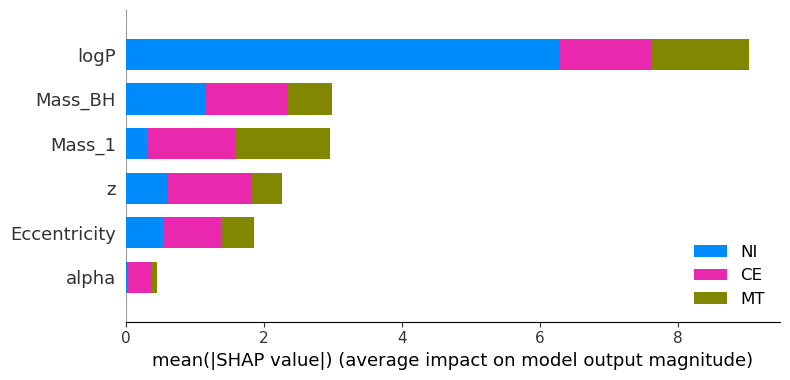

In [10]:
import shap

# Create a SHAP explainer for the trained XGBoost classifier
explainer = shap.TreeExplainer(xgb_classifier)

# Calculate SHAP values for the test set
shap_values = explainer.shap_values(X_test)

# Plot the summary plot of SHAP values
shap.summary_plot(shap_values, X_test, plot_type="bar", class_names=['CE', 'MT', 'NI'])

### Summary plot (bar type) for labels inspection

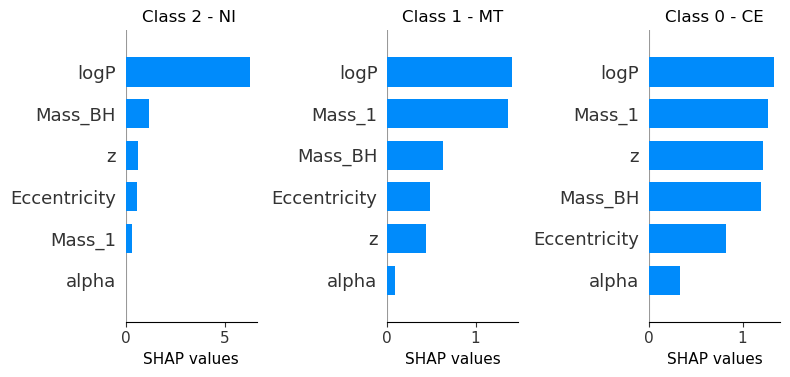

In [11]:
fig = plt.figure(figsize=(20,10))

ax0 = fig.add_subplot(131)
ax0.title.set_text('Class 2 - NI ')
shap.summary_plot(shap_values[2], X_test, plot_type="bar", show=False)
ax0.set_xlabel(r'SHAP values', fontsize=11)
plt.subplots_adjust(wspace = 5)

ax1 = fig.add_subplot(132)
ax1.title.set_text('Class 1 - MT')
shap.summary_plot(shap_values[1], X_test, plot_type="bar", show=False)
plt.subplots_adjust(wspace = 5)
ax1.set_xlabel(r'SHAP values', fontsize=11)

ax2 = fig.add_subplot(133)
ax2.title.set_text('Class 0 - CE')
shap.summary_plot(shap_values[0], X_test, plot_type="bar", show=False)
ax2.set_xlabel(r'SHAP values', fontsize=11)

# plt.tight_layout(pad=3) # You can also use plt.tight_layout() instead of using plt.subplots_adjust() to add space between plots
plt.show()

### Summary plot (violin type) for each label (evolution channel)

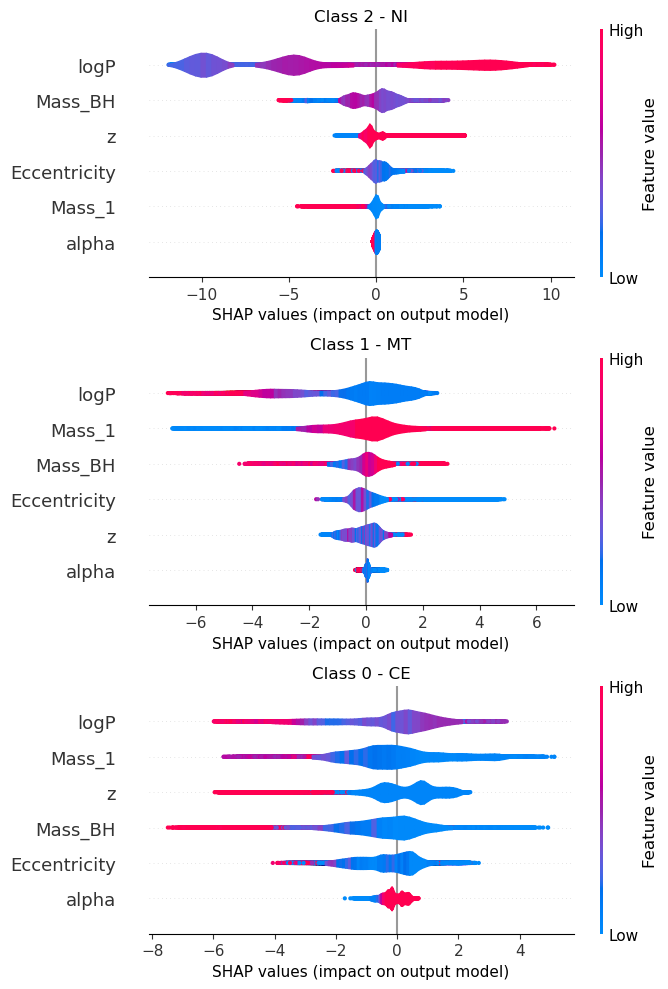

In [12]:
fig = plt.figure()

ax0 = fig.add_subplot(311)
ax0.set_title('Class 2 - NI')
shap.summary_plot(shap_values[2], X_test, plot_type='violin', show=False)
ax0.set_xlabel('SHAP values (impact on output model)', fontsize=11)



ax1 = fig.add_subplot(312)
ax1.set_title('Class 1 - MT')
shap.summary_plot(shap_values[1], X_test, plot_type='violin', show=False)
ax1.set_xlabel('SHAP values (impact on output model)', fontsize=11)


ax2 = fig.add_subplot(313)
plt.title('Class 0 - CE')
shap.summary_plot(shap_values[0], X_test, plot_type='violin', show=False)
plt.xlabel('SHAP values (impact on output model)', fontsize=11)

plt.subplots_adjust(hspace = 50)
plt.gcf().set_size_inches(7,10)
plt.tight_layout()
plt.show()


In this section we try to give an astrophysical interpretation to the results illustrated by the plot above.

- **Non-Interacting (NI)**:
    - `logP` (Period): High values of the period contribute greatly. This is because systems that have never interacted, and therefore have not developed orbital energy dissipation mechanisms, are characterized by very long periods. 
    - `Mass_BH`: Intermediate mass values appear to be favored. This preference can be attributed to the fact that stars, which subsequently underwent to the process of evolving into BHs, and have not interacted with the companions, retain higher mass values. Consequently, these stars evolve into BHs with greater mass compared to systems involving interactions with companions.
    - `z`: Based on the previous discussion regarding the DNN classification results, this feature interpretation is inconsistent from an astrophysical point of view.
    - `Eccentricity`: This feature interpretation is inconsistent from an astrophysical point of view.
    - `Mass_1`: It is not clear what is the contribution of this feature.
    - `alpha`: It seems not contribute to labeling.  

------------------------------------------------

- **(stable) Mass Transfer (MT)**:
    - `logP` (Period): Low period values contribute significantly because, through mass transfer mechanisms, the systems dissipated orbital energy by shortening the period.
    - `Mass_1` & `Mass_BH`: For the same reason, as in the DNN, high mass values are generally preferred because during their star-star evolutionary phase, it is likely that the mass ratio of the two objects was below qc​. Consequently, the information about q is expected to have influenced the mass values in the BH-MS phase, playing a significant role in determining the classification of the system as a stable mass transfer (MT) system. It should be noted that it is not crystal clear whether the model has really identified what the importance of astrophysically correct values is in assigning this label.
    - `Eccentricity`: Slight contribution given by low to medium values of eccentricity.
    - `z`: It seem not to contribute strongly. Moreover this feature interpretation is inconsistent from an astrophysical point of view.
    - `alpha`: It seems not contribute to labeling.
    
------------------------------------------
      
- **(at least one) Common Envelope (CE)**:
    - `Mass_BH` and `Mass_1`: For the same reason, as in the DNN, it is possible to think the mass ratio during the star-star phase was above the critical value qc​, indicating the occurrence of at least one common envelope (CE) phase in the system's evolution. However, it should be noted that it is not crystal clear whether the model has really identified what the importance of astrophysically correct values is in assigning this label.
    In order to enhance the model's understanding and recognition of the threshold ($q_c$) described above, one potential avenue for improvement in future iterations is the inclusion of additional training data. This could involve incorporating information regarding the initial mass ratio of the binary system, or the mass ration in each phase experienced by the donor star.
    In our training experiments, we found that including the mass ratio of the BH-MS system as a feature led to a notable decrease of at least 10 percentage points in the model's accuracy. Therefore, we decided to exclude this feature to prioritize higher accuracy in the categorization process.
    - `logP` (Period) and `Eccentricity`: Low values of period and eccentricity contribute greatly. Through one or more common envelopes the system interacts and loses orbital energy resulting in period reduction and circularization of the orbit.
    - `z`: This feature interpretation is inconsistent from an astrophysical point of view.
    - `alpha`: It seems not contribute to labeling.

# XGBoost model for Classification of candidates <a class="anchor" id="xgb_restr"></a>

[(To T.O.C.)](#toc)

In order to effectively classify the dataset containing candidate BH+MS systems, it is imperative to train the model using the exact features present in that particular dataset. These features include `Mass_BH`, `Mass_1`, and `logP`. It is crucial to note that these features have been appropriately scaled, just as in the previous model, to ensure consistency and enhance the training process.

After performing a GridSearchCV, the optimal hyperparameters were determined to be as follows: `learning_rate`=1, `n_estimators`=300, and `max_depth`=7.

**The overall accuracy of the model is approximately 92%. When assessing the accuracy of specific labels, it was observed that the accuracy for the CE and MT labels is around 90%, whereas for the NI label, the accuracy reaches 98%**. These findings indicate the model's proficiency in correctly classifying instances across different labels, with particularly high accuracy for the NI category.

<timed exec>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Accuracy: 0.9233999364700596
Precision: 0.9233124396910896
Recall: 0.9233999364700596
F1-Score: 0.9233331598083608


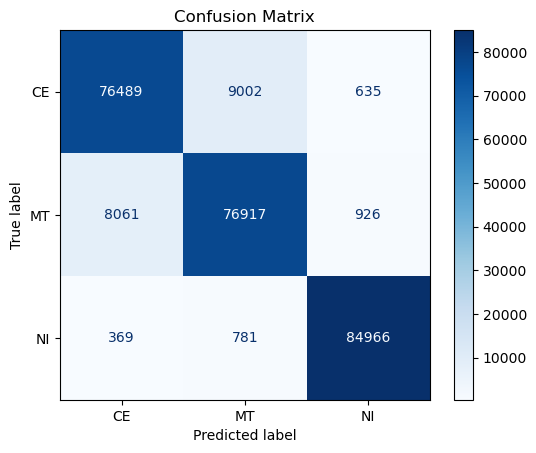

Classification Report:
              precision    recall  f1-score   support

          CE       0.90      0.89      0.89     86126
          MT       0.89      0.90      0.89     85904
          NI       0.98      0.99      0.98     86116

    accuracy                           0.92    258146
   macro avg       0.92      0.92      0.92    258146
weighted avg       0.92      0.92      0.92    258146

CPU times: user 1h 16min 30s, sys: 1min 33s, total: 1h 18min 3s
Wall time: 7min 50s


In [17]:
%%time

import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from xgboost import XGBClassifier
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import confusion_matrix, classification_report

# Load the dataset
data = shuffle_data

# Separate the features and labels
X = data[['Mass_BH', 'Mass_1', 'logP']]
y = data['type']

selected_columns = ['Mass_BH', 'Mass_1', 'logP']
scaler = StandardScaler()
X[selected_columns] = scaler.fit_transform(X[selected_columns])

# Perform label encoding on the labels
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create and train the XGBoost classifier
xgb_classifier = XGBClassifier(n_jobs=10, learning_rate=1, n_estimators=300, max_depth=7)
xgb_classifier.fit(X_train, y_train)

# Predict on the validation set
y_pred = xgb_classifier.predict(X_test)

# Calculate and print the evaluation scores
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1-Score:", f1)

# Plot the confusion matrix
cm = confusion_matrix(y_test, y_pred)
classes = label_encoder.classes_
display = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)
display.plot(cmap='Blues')
plt.title("Confusion Matrix")
plt.show()

# Print classification report
target_names = label_encoder.classes_
classification_rep = classification_report(y_test, y_pred, target_names=target_names)
print("Classification Report:")
print(classification_rep)

xgb_classifier.save_model('xgb_candidates_model.model')

### SHAP explainer <a class="anchor" id="shap_xgb_restr"></a>

[SHAP explainer](#shap_dnn_all)

[(To T.O.C.)](#toc)

### Summary plot (bar type) for global inspection

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


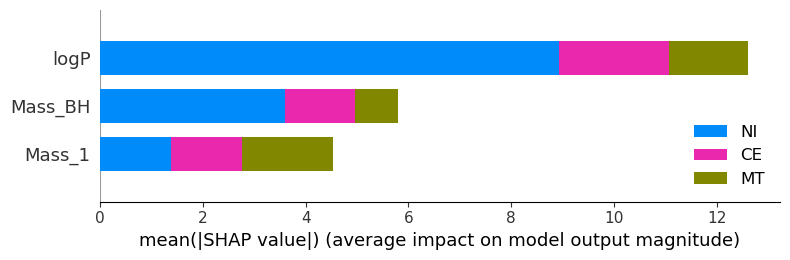

In [10]:
import shap

# Create a SHAP explainer for the trained XGBoost classifier
explainer = shap.TreeExplainer(xgb_classifier)

# Calculate SHAP values for the test set
shap_values = explainer.shap_values(X_test)

# Plot the summary plot of SHAP values
shap.summary_plot(shap_values, X_test, plot_type="bar", class_names=['CE', 'MT', 'NI'])

### Summary plot (bar type) for labels inspection

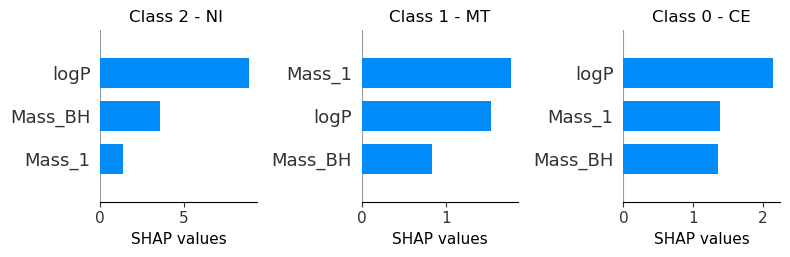

In [11]:
fig = plt.figure(figsize=(20,10))

ax0 = fig.add_subplot(131)
ax0.title.set_text('Class 2 - NI ')
shap.summary_plot(shap_values[2], X_test, plot_type="bar", show=False)
ax0.set_xlabel(r'SHAP values', fontsize=11)
plt.subplots_adjust(wspace = 5)

ax1 = fig.add_subplot(132)
ax1.title.set_text('Class 1 - MT')
shap.summary_plot(shap_values[1], X_test, plot_type="bar", show=False)
plt.subplots_adjust(wspace = 5)
ax1.set_xlabel(r'SHAP values', fontsize=11)

ax2 = fig.add_subplot(133)
ax2.title.set_text('Class 0 - CE')
shap.summary_plot(shap_values[0], X_test, plot_type="bar", show=False)
ax2.set_xlabel(r'SHAP values', fontsize=11)

# plt.tight_layout(pad=3) # You can also use plt.tight_layout() instead of using plt.subplots_adjust() to add space between plots
plt.show()

# Naive Bayesian Classifier <a class="anchor" id="nbc"></a>

[(To T.O.C.)](#toc)

A [Naive Bayes classifier](https://en.wikipedia.org/wiki/Naive_Bayes_classifier) is a simple probabilistic machine learning [algorithm](https://scikit-learn.org/stable/modules/naive_bayes.html) based on the Bayes' theorem, which assumes independence among the features. It is called "naive" because it makes a strong assumption of feature independence, even though this assumption may not hold true in real-world scenarios.
The classifier is primarily used for classification tasks. The features are considered independent of each other, meaning that the presence or absence of one feature does not affect the presence or absence of another feature. This assumption greatly simplifies the calculation of probabilities.

To classify a new input, the Naive Bayes classifier calculates the probability of each class given the input features and selects the class with the highest probability.

The training process of a Naive Bayes classifier involves estimating the probabilities required for the classification. This typically involves counting occurrences of features in labeled training data and applying smoothing techniques to handle unseen features.

The NBC was initially considered for implementation; however, it was found unsuitable due to the assumption of feature independence. Since the features in the dataset were observed to be dependent on each other, the NBC yielded suboptimal results with an accuracy of less than 80%. Consequently, the decision was made to abandon the NBC algorithm in favor of the two alternative approaches previously mentioned.


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Best Parameters: {'var_smoothing': 1e-05}
Cross-Validation Scores: [0.78786632 0.7860989  0.78658796 0.78635069 0.78637975]
Mean Cross-Validation Score: 0.7866567239342229
Accuracy: 0.7852339373842709
Precision: 0.7950421264785791
Recall: 0.7855864465026509
F1-Score: 0.7808045544641096


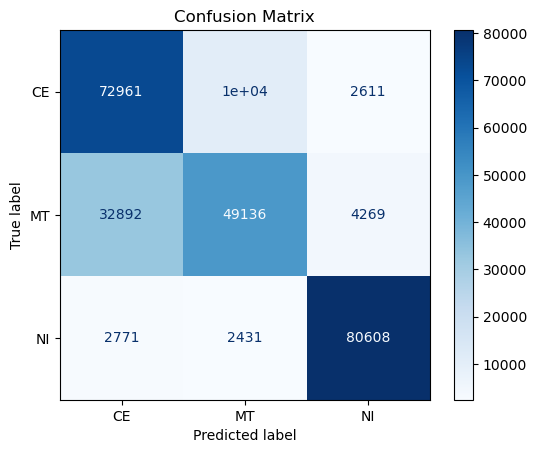

Classification Report:
              precision    recall  f1-score   support

          CE       0.67      0.85      0.75     86039
          MT       0.79      0.57      0.66     86297
          NI       0.92      0.94      0.93     85810

    accuracy                           0.79    258146
   macro avg       0.80      0.79      0.78    258146
weighted avg       0.79      0.79      0.78    258146



In [13]:
from sklearn.naive_bayes import GaussianNB
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.linear_model import Ridge

# Load the dataset
data = shuffle_data

# Separate the features and labels
X = data[['Mass_BH', 'Mass_1', 'Eccentricity', 'logP', 'z', 'alpha']]
y = data['type']

selected_columns = ['Mass_BH', 'Mass_1', 'Eccentricity', 'logP']
scaler = StandardScaler()
X[selected_columns] = scaler.fit_transform(X[selected_columns])

# Perform label encoding on the labels
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a Gaussian Naive Bayes classifier with Ridge regularization
nb_classifier = GaussianNB()

# Define the parameter grid for the grid search
param_grid = {
    'var_smoothing': [1e-9, 1e-8, 1e-7, 1e-6, 1e-5, 1e-1]
}

# Perform grid search using cross-validation
grid_search = GridSearchCV(estimator=nb_classifier, param_grid=param_grid, cv=5)
grid_search.fit(X_train, y_train)

# Get the best estimator from the grid search
best_classifier = grid_search.best_estimator_

# Perform cross-validation with the best classifier
cross_val_scores = cross_val_score(best_classifier, X_train, y_train, cv=5)

# Make predictions on the test set using the best estimator
y_pred = best_classifier.predict(X_test)

# Calculate and print the evaluation scores
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='macro')
recall = recall_score(y_test, y_pred, average='macro')
f1 = f1_score(y_test, y_pred, average='macro')

print("Best Parameters:", grid_search.best_params_)
print("Cross-Validation Scores:", cross_val_scores)
print("Mean Cross-Validation Score:", cross_val_scores.mean())
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1-Score:", f1)

# Plot the confusion matrix
cm = confusion_matrix(y_test, y_pred)
classes = label_encoder.classes_
display = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)
display.plot(cmap='Blues')
plt.title("Confusion Matrix")
plt.show()

# Print classification report
target_names = label_encoder.classes_
classification_rep = classification_report(y_test, y_pred, target_names=target_names)
print("Classification Report:")
print(classification_rep)

----------------
----------------

# Sampling candidates values <a class="anchor" id="sampling"></a>

[(To T.O.C.)](#toc)

Now that we have trained the models, we can move on to classifying the BH+MS candidates in the [Gaia DR3 dataset](https://arxiv.org/abs/2206.04392). The [dataset](https://zenodo.org/record/6779374#.ZGN_Ay8QP1s) has been cleaned and processed, resulting in columns that provide information about the masses of the two objects and their periods, with upper and lower limits, and a measure of the reliability of the data called `plating`. We've also added four confirmed BH+MS systems to the candidate dataset: BH1, VFTS 243, HD130298, and BH2*.  

In order to proceed with classification and statistical analysis, we, firstly, uniformly sampled 10000 values for each system in order to calculate the mean and standard deviation of the features. Subsequently, we utilized these calculated mean and standard deviation values to generate 10000 Gaussian samples for each feature of every system. By employing Gaussian sampling, we ensured that the generated values closely adhere to the statistical characteristics of the respective features in each system.

In [ ]:
# DO NOT run this cell. The file has been already generated

candidates_data = pd.read_csv('../candidates_clean.csv')
candidates_data

normal_df = candidates_data.copy()

def calculate_mean_and_std(dataframe, lower_bound, upper_bound, num_samples):
    samples = dataframe.apply(lambda row: np.random.uniform(row[lower_bound], row[upper_bound], size=num_samples), axis=1)
    mean = samples.apply(np.mean)
    std_dev = samples.apply(np.std)
     
    return mean, std_dev

mean_bh, std_dev_bh = calculate_mean_and_std(normal_df, 'Mass_BH_lower', 'Mass_BH_upper', 10000)

mass_bh_df = pd.DataFrame({'Mass_BH_mean': mean_bh, 'Mass_BH_std': std_dev_bh})

mean_1, std_dev_1 = calculate_mean_and_std(normal_df, 'Mass_1_lower', 'Mass_1_upper', 10000)

mass_1_df = pd.DataFrame({'Mass_1_mean': mean_1, 'Mass_1_std': std_dev_1})

mean_p, std_dev_p = calculate_mean_and_std(normal_df, 'logP_lower', 'logP_upper', 10000)

logp_df = pd.DataFrame({'logP_mean': mean_p, 'logP_std': std_dev_p})

mean_std_df = pd.concat([normal_df['source_id'], mass_bh_df, mass_1_df, logp_df], axis=1)

mean_std_df

%%time
sampled_df = pd.DataFrame(columns=['ID', 'Mass_BH', 'Mass_1', 'logP'])

for unique_id in mean_std_df['source_id']:
    subset = mean_std_df[mean_std_df['source_id'] == unique_id]
    samples = pd.DataFrame({
        'ID': unique_id,
        'Mass_BH': np.random.normal(subset['Mass_BH_mean'], subset['Mass_BH_std'], (10)).reshape(-1),
        'Mass_1': np.random.normal(subset['Mass_1_mean'], subset['Mass_1_std'], (10)).reshape(-1),
        'logP': np.random.normal(subset['logP_mean'], subset['logP_std'], (10)).reshape(-1)
    })
    
    
    sampled_df = pd.concat([sampled_df, samples], ignore_index=True)

sampled_df.to_csv('./sampled_df.csv')

# Candidates classification <a class="anchor" id="cand_class"></a>

[(To T.O.C.)](#toc)

In this section, we proceed with the actual classification of the previously generated dataset, which contains 10,000 samples for each binary system: first with Deep Neural Network (DNN) model and after with an XGBoost model.

The classification process generates a new dataset where each binary system is associated with a percentage value for each label. These percentage values provide insights into the success and level of certainty in the classification for each system. By setting a threshold based on statistical significance, such as 1, 2, or 3 standard deviations (sigma), we can identify systems that have been classified successfully and with a reasonable level of confidence.

Subsequently, we compare the distribution of simulated data from SEVN, used for model training (`shuffle_data`), with the candidate binary systems. We narrow down the analysis to those categorized as 'gold' since their inferred parameters are more reliable compared to 'silver' and 'bronze'. The reason for this is that when observing a binary system of this kind, the orbital period is the only well-constrained measurement. Masses, on the other hand, are not as straightforward to measure, and numerical values should always be treated with caution. Furthermore, we have chosen, from the simulated data, the system with a metallicity of `z=0.02`. This decision was made because the systems observed by GAIA exhibit, overall, solar-like metallicity.

By comparing the simulated data with the observed gold systems, we can assess how well SEVN model capture the characteristics of real binary systems. If the simulated data closely aligns with the gold systems, it provides evidence that the model is accurately capturing the underlying physics governing these binary systems. However, discrepancies between the simulated and observed distributions could indicate potential limitations or missing aspects in the simulations, or poor measurement of the physical parameters of the observed systems.

The comparison of the two models' classification results reveals a consistent agreement between them, indicating reliability and coherence. Moreover, a close correspondence is observed between the simulated data and the Gaia observations in the logP-Mass_BH phase space, suggesting a good congruence. However, when considering the MS masses (Mass_1), a significant discrepancy arises, particularly for values below 10 Msun. The discrepancy poses a challenge in providing a definitive and unequivocal explanation, as the current models do not anticipate MS stars in MS-BH systems to be so lightweight. Several potential explanations can be explored within a scientific context:

- Reevaluating mass transfer mechanisms: It may be necessary to revisit the role of mass transfer in the evolutionary processes of MS-BH systems. This reevaluation could involve investigating scenarios in which the mass loss experienced by stars during mass transfer events is more significant than currently accounted for in the models. By assuming that MS-BHs form after at least one mass transfer event. (least favorable hypothesis)

- Limitations of current stellar tracks: The simulations, specifically the SEVN model, employ stellar tracks with a minimum zero-age main sequence mass (MZAMS) of 2.2 Msun. Considering that Gaia primarily observes stars around this mass range, the absence of stellar tracks for lighter objects in the SEVN model might contribute to the observed gap in the simulations. This discrepancy could be addressed by incorporating stellar tracks that encompass a broader range of masses, thereby enabling the simulation of lighter MS objects. Notably, when examining more massive MS stars (represented by the pair of squares on the right in the last row of graphs), the observed data aligns with the simulation, indicating a match between observation and expectation.


## DNN classification <a class="anchor" id="dnn_class"></a>

[(To T.O.C.)](#toc)

In [6]:
%%time

import pandas as pd
from sklearn.preprocessing import StandardScaler, LabelEncoder
import keras
import tensorflow.python.keras.saving
import tensorflow as tf

# Load the candidates_df dataset
candidates_data_dnn = pd.read_csv('./dev_nb/sampled_df.csv')

# Preprocess the features
new_X = candidates_data_dnn[['Mass_BH', 'Mass_1', 'logP']]
selected_columns = ['Mass_BH', 'Mass_1', 'logP']
scaler = StandardScaler()
new_X[selected_columns] = scaler.fit_transform(new_X[selected_columns])

# Load the trained model
model_path = './dnn_candidates_model.keras'
trained_dnn_model = tf.keras.models.load_model(model_path)

# Make predictions using the trained model
new_y_pred = trained_dnn_model.predict(new_X[selected_columns])

# Convert the predicted labels back to their original format
new_labels = label_encoder.inverse_transform(np.argmax(new_y_pred, axis=1))
# Add the predicted labels to the candidates_df dataset
candidates_data_dnn['pred_type'] = new_labels

candidates_data_dnn

<timed exec>:8: DtypeWarning: Columns (1) have mixed types. Specify dtype option on import or set low_memory=False.
<timed exec>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1451563/1451563 [==============================] - 1090s 750us/step
CPU times: user 39min 26s, sys: 5min 7s, total: 44min 34s
Wall time: 39min 43s


,Unnamed: 0,ID,Mass_BH,Mass_1,logP,pred_type
0,0,BH1,9.590979,0.921201,2.268393,NI
1,1,BH1,9.609804,0.973712,2.268537,NI
2,2,BH1,9.589374,0.917625,2.268658,NI
3,3,BH1,9.510476,0.928518,2.268571,NI
4,4,BH1,9.560426,0.868599,2.268395,NI
...,...,...,...,...,...,...
46449995,46449995,6905561397628246656,3.373748,0.520781,1.897532,NI
46449996,46449996,6905561397628246656,3.524184,1.783396,1.824792,MT
46449997,46449997,6905561397628246656,1.874629,2.836126,2.064233,NI
46449998,46449998,6905561397628246656,3.068341,1.435657,2.004948,NI


In [7]:
grouped_data_dnn = candidates_data_dnn.groupby('ID')['pred_type'].value_counts().unstack()

# Calculate the total count of type occurrences for each group
grouped_data_dnn['total_count'] = grouped_data_dnn.sum(axis=1)

# Calculate the percentage occurrence for each type value within each group
for type_value in ['CE', 'MT', 'NI']:
    grouped_data_dnn[type_value + '_percentage'] = grouped_data_dnn[type_value] / grouped_data_dnn['total_count'] * 100
    
grouped_data_dnn.fillna(0, inplace=True)

# Function to retrieve results for a specific ID
def get_results_by_id(id_value):
    result = grouped_data_dnn.loc[id_value]
    return result[['CE_percentage', 'MT_percentage', 'NI_percentage']]

grouped_data_dnn


pred_type,CE,MT,NI,total_count,CE_percentage,MT_percentage,NI_percentage
ID,,,,,,,
9720614798216320,6974.0,2847.0,179.0,10000.0,69.74,28.47,1.79
9881104840594176,905.0,3898.0,5197.0,10000.0,9.05,38.98,51.97
14686108092825984,532.0,382.0,9086.0,10000.0,5.32,3.82,90.86
30994481168584576,1.0,97.0,9902.0,10000.0,0.01,0.97,99.02
40994951741021312,13.0,37.0,9950.0,10000.0,0.13,0.37,99.50
...,...,...,...,...,...,...,...
419676067845573376,2093.0,6448.0,1459.0,10000.0,20.93,64.48,14.59
BH1,0.0,0.0,10000.0,10000.0,0.00,0.00,100.00
BH2*,0.0,0.0,10000.0,10000.0,0.00,0.00,100.00


In [8]:
grouped_data_dnn = grouped_data_dnn.reset_index()

In [10]:
#grouped_data_dnn.to_csv('./grouped_data_dnn.csv')
grouped_data_dnn = pd.read_csv('./grouped_data_dnn.csv')
grouped_data_dnn

,Unnamed: 0,ID,CE,MT,NI,total_count,CE_percentage,MT_percentage,NI_percentage
0,0,9720614798216320,6974.0,2847.0,179.0,10000.0,69.74,28.47,1.79
1,1,9881104840594176,905.0,3898.0,5197.0,10000.0,9.05,38.98,51.97
2,2,14686108092825984,532.0,382.0,9086.0,10000.0,5.32,3.82,90.86
3,3,30994481168584576,1.0,97.0,9902.0,10000.0,0.01,0.97,99.02
4,4,40994951741021312,13.0,37.0,9950.0,10000.0,0.13,0.37,99.50
...,...,...,...,...,...,...,...,...,...
4641,4641,419676067845573376,2093.0,6448.0,1459.0,10000.0,20.93,64.48,14.59
4642,4642,BH1,0.0,0.0,10000.0,10000.0,0.00,0.00,100.00
4643,4643,BH2*,0.0,0.0,10000.0,10000.0,0.00,0.00,100.00
4644,4644,HD130298,0.0,10000.0,0.0,10000.0,0.00,100.00,0.00


In [11]:
selected_ids_ni = grouped_data_dnn[grouped_data_dnn['NI_percentage'] >= 68.27].index
selected_ids_ce = grouped_data_dnn[grouped_data_dnn['CE_percentage'] >= 68.27].index
selected_ids_mt = grouped_data_dnn[grouped_data_dnn['MT_percentage'] >= 68.27].index

selected_ids_ni_2 = grouped_data_dnn[grouped_data_dnn['NI_percentage'] >= 95.45].index
selected_ids_ce_2 = grouped_data_dnn[grouped_data_dnn['CE_percentage'] >= 95.45].index
selected_ids_mt_2 = grouped_data_dnn[grouped_data_dnn['MT_percentage'] >= 95.45].index

selected_ids_ni_3 = grouped_data_dnn[grouped_data_dnn['NI_percentage'] >= 99.73].index
selected_ids_ce_3 = grouped_data_dnn[grouped_data_dnn['CE_percentage'] >= 99.73].index
selected_ids_mt_3 = grouped_data_dnn[grouped_data_dnn['MT_percentage'] >= 99.73].index

n_sys = grouped_data_dnn['total_count'].count()

n_sum = len(selected_ids_ni) + len(selected_ids_ce) +len(selected_ids_mt)

# Print the selected IDs
print('Labels above 1 sigma')
print('N° of NI systems:', len(selected_ids_ni), '-->', round((len(selected_ids_ni)/n_sys)*100,2),'%')
print('N° of CE systems:', len(selected_ids_ce), '-->', round((len(selected_ids_ce)/n_sys)*100,2),'%')
print('N° of MT systems:', len(selected_ids_mt), '-->', round((len(selected_ids_mt)/n_sys)*100,2),'%')
print((n_sys - n_sum), '(-->', round((n_sys-n_sum)/n_sys*100,2),'%)', 'systems are not well defined.')

print('\nLabels above 2 sigma')
print('N° of NI systems:', len(selected_ids_ni_2), '-->', round((len(selected_ids_ni_2)/n_sys)*100,2),'%')
print('N° of CE systems:', len(selected_ids_ce_2), '-->', round((len(selected_ids_ce_2)/n_sys)*100,2),'%')
print('N° of MT systems:', len(selected_ids_mt_2), '-->', round((len(selected_ids_mt_2)/n_sys)*100,2),'%')

print('\nLabels above 3 sigma')
print('N° of NI systems:', len(selected_ids_ni_3), '-->', round((len(selected_ids_ni_3)/n_sys)*100,2),'%')
print('N° of CE systems:', len(selected_ids_ce_3), '-->', round((len(selected_ids_ce_3)/n_sys)*100,2),'%')
print('N° of MT systems:', len(selected_ids_mt_3), '-->', round((len(selected_ids_mt_3)/n_sys)*100,2),'%')

Labels above 1 sigma
N° of NI systems: 1280 --> 27.55 %
N° of CE systems: 522 --> 11.24 %
N° of MT systems: 679 --> 14.61 %
2165 (--> 46.6 %) systems are not well defined.

Labels above 2 sigma
N° of NI systems: 775 --> 16.68 %
N° of CE systems: 90 --> 1.94 %
N° of MT systems: 9 --> 0.19 %

Labels above 3 sigma
N° of NI systems: 464 --> 9.99 %
N° of CE systems: 39 --> 0.84 %
N° of MT systems: 2 --> 0.04 %


In [12]:
candidates_data = pd.read_csv('../candidates_clean.csv')
candidates_data = candidates_data.rename(columns={'source_id': 'ID'})
candidates_data

,ID,Mass_BH,Mass_BH_lower,Mass_BH_upper,Mass_1,Mass_1_lower,Mass_1_upper,logP,logP_lower,logP_upper,plating
0,BH1,9.600000,9.420000,9.780000,0.930000,0.880000,0.980000,2.268555,2.268824,2.268285,gold
1,VFTS 243,10.100000,8.100000,12.100000,25.000000,22.700000,27.300000,1.017163,1.017201,1.017124,gold
2,HD130298,7.700000,6.200000,9.200000,24.200000,20.400000,28.000000,1.165232,1.165290,1.165174,gold
3,BH2*,8.900000,8.600000,8.900000,1.070000,0.880000,1.260000,3.113943,3.133943,3.093943,gold
4,382233814260345472,5.630245,3.399461,8.765234,1.245597,0.472308,3.140019,1.274174,0.904620,1.391819,gold
...,...,...,...,...,...,...,...,...,...,...,...
4640,6880178999904386432,3.087731,1.381485,3.916709,1.396381,0.481510,3.870401,1.559077,1.191018,1.678169,bronze
4641,6897545751699258240,4.256348,2.893644,6.246344,2.228563,1.010821,4.710161,2.424738,2.059804,2.545038,bronze
4642,6897983460406613248,3.753208,2.645837,5.828950,1.462476,0.648215,3.146108,1.760500,1.400927,1.883655,bronze
4643,6904310393913182464,9.210390,2.782652,12.251090,1.342463,0.295173,5.721481,1.511221,1.170057,1.638710,bronze


In [13]:
# candidates_data = pd.read_csv('../candidates_clean.csv')
# candidates_data.rename(columns={'source_id': 'ID'})
merged_df_dnn = pd.merge(grouped_data_dnn, candidates_data[['ID', 'plating']], on=['ID'])
merged_df_dnn = merged_df_dnn[merged_df_dnn['Unnamed: 0']!= 901]
merged_df_dnn

,Unnamed: 0,ID,CE,MT,NI,total_count,CE_percentage,MT_percentage,NI_percentage,plating
0,0,9720614798216320,6974.0,2847.0,179.0,10000.0,69.74,28.47,1.79,bronze
1,1,9881104840594176,905.0,3898.0,5197.0,10000.0,9.05,38.98,51.97,silver
2,2,14686108092825984,532.0,382.0,9086.0,10000.0,5.32,3.82,90.86,bronze
3,3,30994481168584576,1.0,97.0,9902.0,10000.0,0.01,0.97,99.02,bronze
4,4,40994951741021312,13.0,37.0,9950.0,10000.0,0.13,0.37,99.50,silver
...,...,...,...,...,...,...,...,...,...,...
4641,4641,419676067845573376,2093.0,6448.0,1459.0,10000.0,20.93,64.48,14.59,gold
4642,4642,BH1,0.0,0.0,10000.0,10000.0,0.00,0.00,100.00,gold
4643,4643,BH2*,0.0,0.0,10000.0,10000.0,0.00,0.00,100.00,gold
4644,4644,HD130298,0.0,10000.0,0.0,10000.0,0.00,100.00,0.00,gold


/tmp/ipykernel_354948/4233863372.py:21: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  data_c_c = candidates_data[4:][candidates_data['plating']=='gold']
/tmp/ipykernel_354948/4233863372.py:22: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  data_l_c = merged_df_dnn[:4641][merged_df_dnn['plating']=='gold']
/tmp/ipykernel_354948/4233863372.py:86: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.
  plt.ylim(0, 40)
/tmp/ipykernel_354948/4233863372.py:103: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.
  plt.ylim(0, 40)
/tmp/ipykernel_354948/4233863372.py:119: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.
  plt.ylim(0, 40)
/tmp/ipykernel_354948/4233863372.py:136: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit w

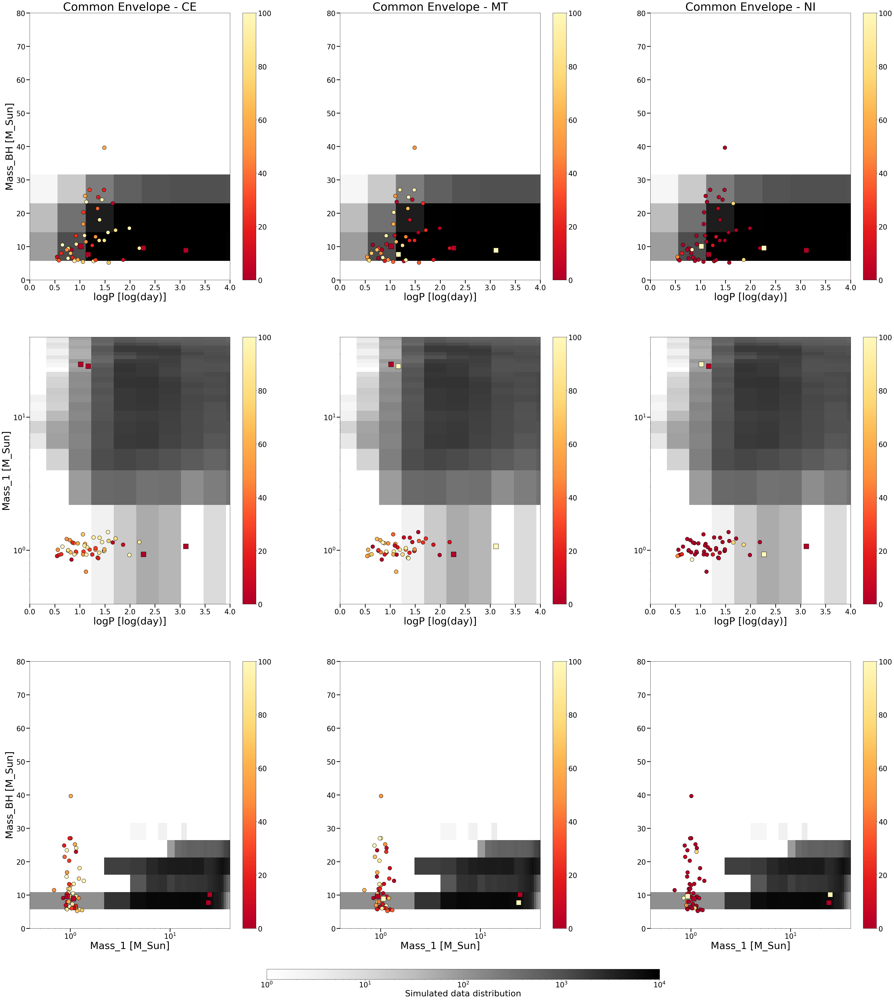

In [14]:
# Superimposed scatter plots differentiating BH+MS sys based on their past evolution

candidates_data = pd.read_csv('../candidates_clean.csv')

#sn.set_palette('bright')
fig, ax = plt.subplots(3, 3, figsize=(48,50))
fig.tight_layout(pad=18.0)

cmaps = cmr.get_sub_cmap('YlOrRd_r', 0.1, 0.95)

#fig.suptitle('Labels % distribution', fontsize=80)

for i in range(3):
    for j in range(3):
        ax[i,j].tick_params(size=12, width=2.5, labelsize=25)
        ax[i,j].xaxis.label.set_size(35)
        ax[i,j].yaxis.label.set_size(35)

data = shuffle_data[shuffle_data['z']==0.02]
data_c_c = candidates_data[4:][candidates_data['plating']=='gold']
data_l_c = merged_df_dnn[:4641][merged_df_dnn['plating']=='gold']
data_c_r = candidates_data.head(4)
data_l_r = merged_df_dnn.tail(4)
        
plt.sca(ax[0,0])
plt.hist2d(data['logP'], data['Mass_BH'], cmap='Greys', norm=matplotlib.colors.LogNorm(vmin=1, vmax=10**4), bins=[20,3])
#cbar = plt.colorbar()
#cbar.ax.tick_params(labelsize=25)
plt.scatter(data_c_c.logP, data_c_c.Mass_BH, marker='o', alpha=1, cmap=cmaps, c=data_l_c.CE_percentage, s=180, vmin=0, vmax=100, edgecolor='k')
plt.scatter(data_c_r.logP, data_c_r.Mass_BH, marker='s', alpha=1, cmap=cmaps, c=data_l_r.CE_percentage, s=300, vmin=0, vmax=100, edgecolor='k')
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=25)
#cbar.set_ticks([0, 20, 40, 60, 80, 100])
#legend = plt.legend()
plt.ylabel('Mass_BH [M_Sun]')
plt.xlabel('logP [log(day)]')
plt.title('Common Envelope - CE', fontsize=40)
plt.ylim(0, 80)
plt.xlim(0, 4)

plt.sca(ax[0,1])
plt.hist2d(data['logP'], data['Mass_BH'], cmap='Greys', norm=matplotlib.colors.LogNorm(vmin=1, vmax=10**4), bins=[20,3])
#cbar = plt.colorbar()
#cbar.ax.tick_params(labelsize=25)
plt.scatter(data_c_c.logP, data_c_c.Mass_BH, marker='o', alpha=1, cmap=cmaps, c=data_l_c.MT_percentage, s=180, edgecolor='k')
plt.scatter(data_c_r.logP, data_c_r.Mass_BH, marker='s', alpha=1, cmap=cmaps, c=data_l_r.MT_percentage, s=300, edgecolor='k')
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=25)
#legend = plt.legend()
#plt.ylabel('Mass_BH [M_Sun]')
plt.xlabel('logP [log(day)]')
plt.title('Common Envelope - MT', fontsize=40)
plt.ylim(0, 80)
plt.xlim(0, 4)

plt.sca(ax[0,2])
plt.hist2d(data['logP'], data['Mass_BH'], cmap='Greys', norm=matplotlib.colors.LogNorm(vmin=1, vmax=10**4), bins=[20,3])
#cbar = plt.colorbar()
#cbar.ax.tick_params(labelsize=25)
plt.scatter(data_c_c.logP, data_c_c.Mass_BH, marker='o', alpha=1, cmap=cmaps, c=data_l_c.NI_percentage, s=180, edgecolor='k')
plt.scatter(data_c_r.logP, data_c_r.Mass_BH, marker='s', alpha=1, cmap=cmaps, c=data_l_r.NI_percentage, s=300, edgecolor='k')
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=25)
#legend = plt.legend()
#plt.ylabel('Mass_BH [M_Sun]')
plt.xlabel('logP [log(day)]')
plt.title('Common Envelope - NI', fontsize=40)
plt.ylim(0, 80)
plt.xlim(0, 4)

plt.sca(ax[1,0])
plt.hist2d(data['logP'], data['Mass_1'], cmap='Greys', norm=matplotlib.colors.LogNorm(vmin=1, vmax=10**4), bins=[25,30])
#cbar = plt.colorbar()
#cbar.ax.tick_params(labelsize=25)
plt.scatter(data_c_c.logP, data_c_c.Mass_1, marker='o', alpha=1, cmap=cmaps, c=data_l_c.CE_percentage, s=180, vmin=0, vmax=100, edgecolor='k')
plt.scatter(data_c_r.logP, data_c_r.Mass_1, marker='s', alpha=1, cmap=cmaps, c=data_l_r.CE_percentage, s=300, vmin=0, vmax=100, edgecolor='k')
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=25)
#cbar.set_ticks([0, 20, 40, 60, 80, 100])
#legend = plt.legend()
#plt.title('Common Envelope - MT', fontsize=35)
plt.ylabel('Mass_1 [M_Sun]')
ax[1,0].set_yscale('log')
plt.xlabel('logP [log(day)]')
plt.ylim(0, 40)
plt.xlim(0, 4)


plt.sca(ax[1,1])
plt.hist2d(data['logP'], data['Mass_1'], cmap='Greys', norm=matplotlib.colors.LogNorm(vmin=1, vmax=10**4), bins=[25,30])
#cbar = plt.colorbar()
#cbar.ax.tick_params(labelsize=25)
plt.scatter(data_c_c.logP, data_c_c.Mass_1, marker='o', alpha=1, cmap=cmaps, c=data_l_c.MT_percentage, s=180, edgecolor='k')
plt.scatter(data_c_r.logP, data_c_r.Mass_1, marker='s', alpha=1, cmap=cmaps, c=data_l_r.MT_percentage, s=300, edgecolor='k')
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=25)
#legend = plt.legend()
#plt.title('Common Envelope - MT', fontsize=35)
#plt.ylabel('Mass_1 [M_Sun]')
ax[1,1].set_yscale('log')
plt.xlabel('logP [log(day)]')
plt.ylim(0, 40)
plt.xlim(0, 4)

plt.sca(ax[1,2])
plt.hist2d(data['logP'], data['Mass_1'], cmap='Greys', norm=matplotlib.colors.LogNorm(vmin=1, vmax=10**4), bins=[25,30])
#cbar = plt.colorbar()
#cbar.ax.tick_params(labelsize=25)
plt.scatter(data_c_c.logP, data_c_c.Mass_1, marker='o', alpha=1, cmap=cmaps, c=data_l_c.NI_percentage, s=180, edgecolor='k')
plt.scatter(data_c_r.logP, data_c_r.Mass_1, marker='s', alpha=1, cmap=cmaps, c=data_l_r.NI_percentage, s=300, edgecolor='k')
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=25)
#legend = plt.legend()
#plt.title('Common Envelope - MT', fontsize=35)
#plt.ylabel('Mass_1 [M_Sun]')
ax[1,2].set_yscale('log')
plt.xlabel('logP [log(day)]')
plt.ylim(0, 40)
plt.xlim(0, 4)

plt.sca(ax[2,0])
plt.hist2d(data['Mass_1'], data['Mass_BH'], cmap='Greys', norm=matplotlib.colors.LogNorm(vmin=1, vmax=10**4), bins=[30,5])
#cbar = plt.colorbar()
#cbar.ax.tick_params(labelsize=25)
plt.scatter(data_c_c.Mass_1, data_c_c.Mass_BH, marker='o', alpha=1, cmap=cmaps, c=data_l_c.CE_percentage, s=180, vmin=0, vmax=100, edgecolor='k')
plt.scatter(data_c_r.Mass_1, data_c_r.Mass_BH, marker='s', alpha=1, cmap=cmaps, c=data_l_r.CE_percentage, s=300, vmin=0, vmax=100, edgecolor='k')
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=25)
#cbar.set_ticks([0, 20, 40, 60, 80, 100])
#legend = plt.legend()
plt.xlabel('Mass_1 [M_Sun]')
ax[2,0].set_xscale('log')
plt.ylabel('Mass_BH [M_Sun]')
#plt.title('Common Envelope - CE', fontsize=35)
plt.xlim(0, 40)
plt.ylim(0, 80)

plt.sca(ax[2,1])
plt.hist2d(data['Mass_1'], data['Mass_BH'], cmap='Greys', norm=matplotlib.colors.LogNorm(vmin=1, vmax=10**4), bins=[30,5])
# cbar = plt.colorbar()
# cbar.ax.tick_params(labelsize=25)
plt.scatter(data_c_c.Mass_1, data_c_c.Mass_BH, marker='o', alpha=1, cmap=cmaps, c=data_l_c.MT_percentage, s=180, edgecolor='k')
plt.scatter(data_c_r.Mass_1, data_c_r.Mass_BH, marker='s', alpha=1, cmap=cmaps, c=data_l_r.MT_percentage, s=300, edgecolor='k')
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=25)
#legend = plt.legend()
plt.xlabel('Mass_1 [M_Sun]')
ax[2,1].set_xscale('log')
#plt.ylabel('Mass_BH [M_Sun]')
#plt.title('Common Envelope - MT', fontsize=35)
plt.xlim(0, 40)
plt.ylim(0, 80)

plt.sca(ax[2,2])
plt.hist2d(data['Mass_1'], data['Mass_BH'], cmap='Greys', norm=matplotlib.colors.LogNorm(vmin=1, vmax=10**4), bins=[30,5])
# cbar = plt.colorbar()
# cbar.ax.tick_params(labelsize=25)
plt.scatter(data_c_c.Mass_1, data_c_c.Mass_BH, marker='o', alpha=1, cmap=cmaps, c=data_l_c.NI_percentage, s=180, edgecolor='k')
plt.scatter(data_c_r.Mass_1, data_c_r.Mass_BH, marker='s', alpha=1, cmap=cmaps, c=data_l_r.NI_percentage, s=300, edgecolor='k')
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=25)
#legend = plt.legend()
plt.xlabel('Mass_1 [M_Sun]')
ax[2,2].set_xscale('log')
#plt.ylabel('Mass_BH [M_Sun]')
#plt.title('Common Envelope - NI', fontsize=35)
plt.xlim(0, 40)
plt.ylim(0, 80)

# Add colorbar at the bottom
#cbar_ax_1 = fig.add_axes([0.15, 0.005, 0.33, 0.015])  # [left, bottom, width, height]
#cbar1 = fig.colorbar(matplotlib.cm.ScalarMappable(norm=matplotlib.colors.Normalize(vmin=0, vmax=100), cmap=cmaps), cax=cbar_ax_1, orientation='horizontal')
#cbar1.ax.tick_params(labelsize=25)
#cbar1.set_label('Label percentage', fontsize=30)

cbar_ax = fig.add_axes([0.3, 0.005, 0.4, 0.01])
#cbar_ax = fig.add_axes([0.527, 0.005, 0.33, 0.015])  # [left, bottom, width, height]
cbar = plt.colorbar(plt.cm.ScalarMappable(norm=matplotlib.colors.LogNorm(vmin=1, vmax=10**4), cmap='Greys'), cax=cbar_ax, orientation='horizontal')
cbar.ax.tick_params(labelsize=25)
cbar.set_label('Simulated data distribution', fontsize=30)


plt.show()

## XGBoost classification <a class="anchor" id="xgb_class"></a>

[(To T.O.C.)](#toc)

In [18]:
%%time
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from xgboost import XGBClassifier
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import confusion_matrix, classification_report

trained_xgb_model = xgb.Booster()
trained_xgb_model.load_model('xgb_candidates_model.model')

# Load the new dataset
candidates_data_xgb = pd.read_csv('./dev_nb/sampled_df.csv')

# Preprocess the new data using the same transformations
new_X = candidates_data_xgb[['Mass_BH', 'Mass_1', 'logP']]
selected_columns = ['Mass_BH', 'Mass_1', 'logP']
scaler = StandardScaler()
new_X[selected_columns] = scaler.fit_transform(new_X[selected_columns])

new_dmatrix = xgb.DMatrix(new_X)

# Make predictions using the trained model
new_y_pred = trained_xgb_model.predict(new_dmatrix)

# Predict labels for the new data
#new_y_pred = xgb_classifier.predict(new_X)

# Convert the predicted labels back to their original format

new_labels = label_encoder.inverse_transform(np.argmax(new_y_pred, axis=1))

# Add the predicted labels to the new data DataFrame
candidates_data_xgb['pred_type'] = new_labels

candidates_data_xgb

<timed exec>:13: DtypeWarning: Columns (1) have mixed types. Specify dtype option on import or set low_memory=False.
<timed exec>:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


CPU times: user 23min 2s, sys: 1min 13s, total: 24min 16s
Wall time: 1min 9s


,Unnamed: 0,ID,Mass_BH,Mass_1,logP,pred_type
0,0,BH1,9.590979,0.921201,2.268393,NI
1,1,BH1,9.609804,0.973712,2.268537,NI
2,2,BH1,9.589374,0.917625,2.268658,NI
3,3,BH1,9.510476,0.928518,2.268571,NI
4,4,BH1,9.560426,0.868599,2.268395,NI
...,...,...,...,...,...,...
46449995,46449995,6905561397628246656,3.373748,0.520781,1.897532,NI
46449996,46449996,6905561397628246656,3.524184,1.783396,1.824792,MT
46449997,46449997,6905561397628246656,1.874629,2.836126,2.064233,NI
46449998,46449998,6905561397628246656,3.068341,1.435657,2.004948,NI


In [19]:
grouped_data_xgb = candidates_data_xgb.groupby('ID')['pred_type'].value_counts().unstack()

# Calculate the total count of type occurrences for each group
grouped_data_xgb['total_count'] = grouped_data_xgb.sum(axis=1)

# Calculate the percentage occurrence for each type value within each group
for type_value in ['CE', 'MT', 'NI']:
    grouped_data_xgb[type_value + '_percentage'] = grouped_data_xgb[type_value] / grouped_data_xgb['total_count'] * 100
    
grouped_data_xgb.fillna(0, inplace=True)

# Function to retrieve results for a specific ID
def get_results_by_id(id_value):
    result = grouped_data_xgb.loc[id_value]
    return result[['CE_percentage', 'MT_percentage', 'NI_percentage']]

grouped_data_xgb

pred_type,CE,MT,NI,total_count,CE_percentage,MT_percentage,NI_percentage
ID,,,,,,,
9720614798216320,6426.0,3318.0,256.0,10000.0,64.26,33.18,2.56
9881104840594176,1301.0,3531.0,5168.0,10000.0,13.01,35.31,51.68
14686108092825984,1267.0,318.0,8415.0,10000.0,12.67,3.18,84.15
30994481168584576,2.0,108.0,9890.0,10000.0,0.02,1.08,98.90
40994951741021312,44.0,33.0,9923.0,10000.0,0.44,0.33,99.23
...,...,...,...,...,...,...,...
419676067845573376,1852.0,6594.0,1554.0,10000.0,18.52,65.94,15.54
BH1,0.0,0.0,10000.0,10000.0,0.00,0.00,100.00
BH2*,0.0,0.0,10000.0,10000.0,0.00,0.00,100.00


In [20]:
grouped_data_xgb = grouped_data_xgb.reset_index()

In [22]:
#grouped_data_xgb.to_csv('./grouped_data_xgb.csv')
grouped_data_xgb = pd.read_csv('./grouped_data_xgb.csv')
grouped_data_xgb

,Unnamed: 0,ID,CE,MT,NI,total_count,CE_percentage,MT_percentage,NI_percentage
0,0,9720614798216320,6426.0,3318.0,256.0,10000.0,64.26,33.18,2.56
1,1,9881104840594176,1301.0,3531.0,5168.0,10000.0,13.01,35.31,51.68
2,2,14686108092825984,1267.0,318.0,8415.0,10000.0,12.67,3.18,84.15
3,3,30994481168584576,2.0,108.0,9890.0,10000.0,0.02,1.08,98.90
4,4,40994951741021312,44.0,33.0,9923.0,10000.0,0.44,0.33,99.23
...,...,...,...,...,...,...,...,...,...
4641,4641,419676067845573376,1852.0,6594.0,1554.0,10000.0,18.52,65.94,15.54
4642,4642,BH1,0.0,0.0,10000.0,10000.0,0.00,0.00,100.00
4643,4643,BH2*,0.0,0.0,10000.0,10000.0,0.00,0.00,100.00
4644,4644,HD130298,0.0,10000.0,0.0,10000.0,0.00,100.00,0.00


In [23]:
selected_ids_ni = grouped_data_xgb[grouped_data_xgb['NI_percentage'] >= 68.27].index
selected_ids_ce = grouped_data_xgb[grouped_data_xgb['CE_percentage'] >= 68.27].index
selected_ids_mt = grouped_data_xgb[grouped_data_xgb['MT_percentage'] >= 68.27].index

selected_ids_ni_2 = grouped_data_xgb[grouped_data_xgb['NI_percentage'] >= 95.45].index
selected_ids_ce_2 = grouped_data_xgb[grouped_data_xgb['CE_percentage'] >= 95.45].index
selected_ids_mt_2 = grouped_data_xgb[grouped_data_xgb['MT_percentage'] >= 95.45].index

selected_ids_ni_3 = grouped_data_xgb[grouped_data_xgb['NI_percentage'] >= 99.73].index
selected_ids_ce_3 = grouped_data_xgb[grouped_data_xgb['CE_percentage'] >= 99.73].index
selected_ids_mt_3 = grouped_data_xgb[grouped_data_xgb['MT_percentage'] >= 99.73].index

n_sys = grouped_data_xgb['total_count'].count()

n_sum = len(selected_ids_ni) + len(selected_ids_ce) +len(selected_ids_mt)

# Print the selected IDs
print('Labels above 1 sigma')
print('N° of NI systems:', len(selected_ids_ni), '-->', round((len(selected_ids_ni)/n_sys)*100,2),'%')
print('N° of CE systems:', len(selected_ids_ce), '-->', round((len(selected_ids_ce)/n_sys)*100,2),'%')
print('N° of MT systems:', len(selected_ids_mt), '-->', round((len(selected_ids_mt)/n_sys)*100,2),'%')
print((n_sys - n_sum), '(-->', round((n_sys-n_sum)/n_sys*100,2),'%)', 'systems are not well defined.')

print('\nLabels above 2 sigma')
print('N° of NI systems:', len(selected_ids_ni_2), '-->', round((len(selected_ids_ni_2)/n_sys)*100,2),'%')
print('N° of CE systems:', len(selected_ids_ce_2), '-->', round((len(selected_ids_ce_2)/n_sys)*100,2),'%')
print('N° of MT systems:', len(selected_ids_mt_2), '-->', round((len(selected_ids_mt_2)/n_sys)*100,2),'%')

print('\nLabels above 3 sigma')
print('N° of NI systems:', len(selected_ids_ni_3), '-->', round((len(selected_ids_ni_3)/n_sys)*100,2),'%')
print('N° of CE systems:', len(selected_ids_ce_3), '-->', round((len(selected_ids_ce_3)/n_sys)*100,2),'%')
print('N° of MT systems:', len(selected_ids_mt_3), '-->', round((len(selected_ids_mt_3)/n_sys)*100,2),'%')

Labels above 1 sigma
N° of NI systems: 1277 --> 27.49 %
N° of CE systems: 371 --> 7.99 %
N° of MT systems: 532 --> 11.45 %
2466 (--> 53.08 %) systems are not well defined.

Labels above 2 sigma
N° of NI systems: 678 --> 14.59 %
N° of CE systems: 38 --> 0.82 %
N° of MT systems: 2 --> 0.04 %

Labels above 3 sigma
N° of NI systems: 276 --> 5.94 %
N° of CE systems: 3 --> 0.06 %
N° of MT systems: 1 --> 0.02 %


In [24]:
candidates_data = pd.read_csv('../candidates_clean.csv')
candidates_data = candidates_data.rename(columns={'source_id': 'ID'})
candidates_data

,ID,Mass_BH,Mass_BH_lower,Mass_BH_upper,Mass_1,Mass_1_lower,Mass_1_upper,logP,logP_lower,logP_upper,plating
0,BH1,9.600000,9.420000,9.780000,0.930000,0.880000,0.980000,2.268555,2.268824,2.268285,gold
1,VFTS 243,10.100000,8.100000,12.100000,25.000000,22.700000,27.300000,1.017163,1.017201,1.017124,gold
2,HD130298,7.700000,6.200000,9.200000,24.200000,20.400000,28.000000,1.165232,1.165290,1.165174,gold
3,BH2*,8.900000,8.600000,8.900000,1.070000,0.880000,1.260000,3.113943,3.133943,3.093943,gold
4,382233814260345472,5.630245,3.399461,8.765234,1.245597,0.472308,3.140019,1.274174,0.904620,1.391819,gold
...,...,...,...,...,...,...,...,...,...,...,...
4640,6880178999904386432,3.087731,1.381485,3.916709,1.396381,0.481510,3.870401,1.559077,1.191018,1.678169,bronze
4641,6897545751699258240,4.256348,2.893644,6.246344,2.228563,1.010821,4.710161,2.424738,2.059804,2.545038,bronze
4642,6897983460406613248,3.753208,2.645837,5.828950,1.462476,0.648215,3.146108,1.760500,1.400927,1.883655,bronze
4643,6904310393913182464,9.210390,2.782652,12.251090,1.342463,0.295173,5.721481,1.511221,1.170057,1.638710,bronze


In [25]:
# candidates_data = pd.read_csv('../candidates_clean.csv')
# candidates_data.rename(columns={'source_id': 'ID'})
merged_df_xgb = pd.merge(grouped_data_xgb, candidates_data[['ID', 'plating']], on=['ID'])
merged_df_xgb = merged_df_xgb[merged_df_xgb['Unnamed: 0']!= 901]
merged_df_xgb

,Unnamed: 0,ID,CE,MT,NI,total_count,CE_percentage,MT_percentage,NI_percentage,plating
0,0,9720614798216320,6426.0,3318.0,256.0,10000.0,64.26,33.18,2.56,bronze
1,1,9881104840594176,1301.0,3531.0,5168.0,10000.0,13.01,35.31,51.68,silver
2,2,14686108092825984,1267.0,318.0,8415.0,10000.0,12.67,3.18,84.15,bronze
3,3,30994481168584576,2.0,108.0,9890.0,10000.0,0.02,1.08,98.90,bronze
4,4,40994951741021312,44.0,33.0,9923.0,10000.0,0.44,0.33,99.23,silver
...,...,...,...,...,...,...,...,...,...,...
4641,4641,419676067845573376,1852.0,6594.0,1554.0,10000.0,18.52,65.94,15.54,gold
4642,4642,BH1,0.0,0.0,10000.0,10000.0,0.00,0.00,100.00,gold
4643,4643,BH2*,0.0,0.0,10000.0,10000.0,0.00,0.00,100.00,gold
4644,4644,HD130298,0.0,10000.0,0.0,10000.0,0.00,100.00,0.00,gold


/tmp/ipykernel_184985/1957421266.py:21: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  data_c_c = candidates_data[4:][candidates_data['plating']=='gold']
/tmp/ipykernel_184985/1957421266.py:22: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  data_l_c = merged_df_xgb[:4641][merged_df_xgb['plating']=='gold']
/tmp/ipykernel_184985/1957421266.py:86: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.
  plt.ylim(0, 40)
/tmp/ipykernel_184985/1957421266.py:103: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.
  plt.ylim(0, 40)
/tmp/ipykernel_184985/1957421266.py:119: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.
  plt.ylim(0, 40)
/tmp/ipykernel_184985/1957421266.py:136: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit w

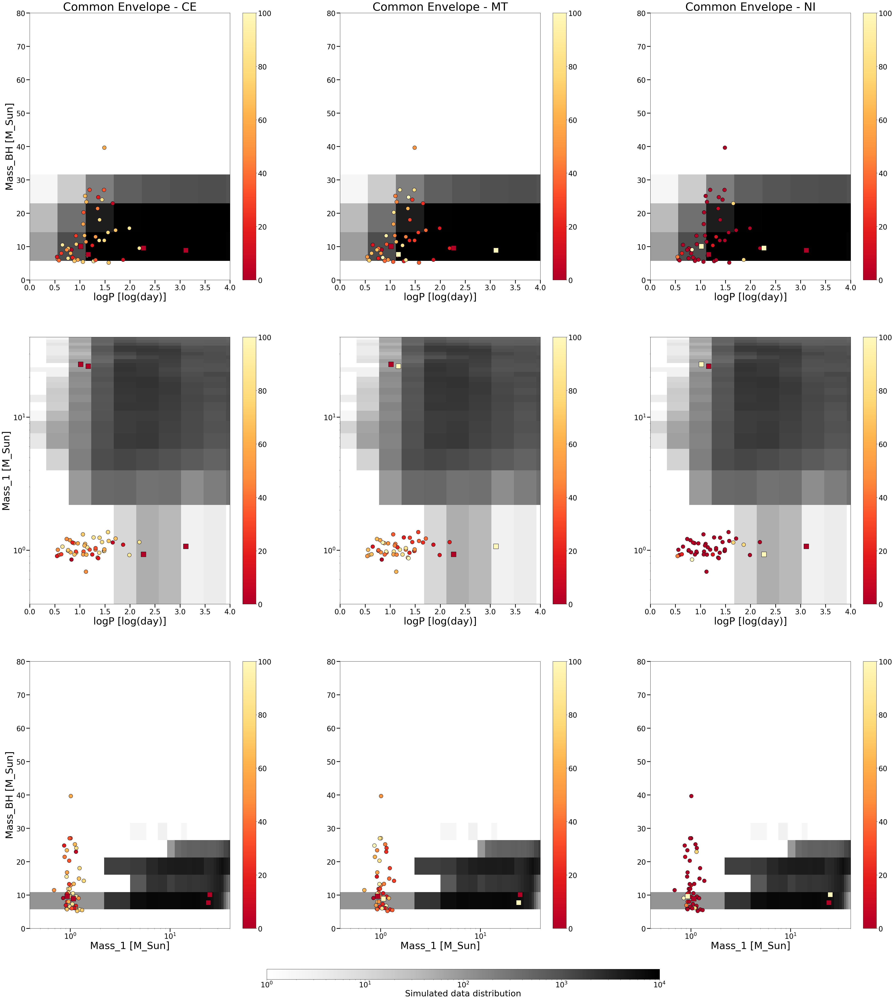

In [26]:
# Same plots as before.
# Superimposed scatter plots differentiating BH+MS sys based on their past evolution

candidates_data = pd.read_csv('../candidates_clean.csv')

#sn.set_palette('bright')
fig, ax = plt.subplots(3, 3, figsize=(48,50))
fig.tight_layout(pad=18.0)

cmaps = cmr.get_sub_cmap('YlOrRd_r', 0.1, 0.95)

#fig.suptitle('Labels % distribution', fontsize=80)

for i in range(3):
    for j in range(3):
        ax[i,j].tick_params(size=12, width=2.5, labelsize=25)
        ax[i,j].xaxis.label.set_size(35)
        ax[i,j].yaxis.label.set_size(35)

data = shuffle_data[shuffle_data['z']==0.02]
data_c_c = candidates_data[4:][candidates_data['plating']=='gold']
data_l_c = merged_df_xgb[:4641][merged_df_xgb['plating']=='gold']
data_c_r = candidates_data.head(4)
data_l_r = merged_df_xgb.tail(4)
        
plt.sca(ax[0,0])
plt.hist2d(data['logP'], data['Mass_BH'], cmap='Greys', norm=matplotlib.colors.LogNorm(vmin=1, vmax=10**4), bins=[20,3])
#cbar = plt.colorbar()
#cbar.ax.tick_params(labelsize=25)
plt.scatter(data_c_c.logP, data_c_c.Mass_BH, marker='o', alpha=1, cmap=cmaps, c=data_l_c.CE_percentage, s=180, vmin=0, vmax=100, edgecolor='k')
plt.scatter(data_c_r.logP, data_c_r.Mass_BH, marker='s', alpha=1, cmap=cmaps, c=data_l_r.CE_percentage, s=300, vmin=0, vmax=100, edgecolor='k')
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=25)
#cbar.set_ticks([0, 20, 40, 60, 80, 100])
#legend = plt.legend()
plt.ylabel('Mass_BH [M_Sun]')
plt.xlabel('logP [log(day)]')
plt.title('Common Envelope - CE', fontsize=40)
plt.ylim(0, 80)
plt.xlim(0, 4)

plt.sca(ax[0,1])
plt.hist2d(data['logP'], data['Mass_BH'], cmap='Greys', norm=matplotlib.colors.LogNorm(vmin=1, vmax=10**4), bins=[20,3])
#cbar = plt.colorbar()
#cbar.ax.tick_params(labelsize=25)
plt.scatter(data_c_c.logP, data_c_c.Mass_BH, marker='o', alpha=1, cmap=cmaps, c=data_l_c.MT_percentage, s=180, edgecolor='k')
plt.scatter(data_c_r.logP, data_c_r.Mass_BH, marker='s', alpha=1, cmap=cmaps, c=data_l_r.MT_percentage, s=300, edgecolor='k')
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=25)
#legend = plt.legend()
#plt.ylabel('Mass_BH [M_Sun]')
plt.xlabel('logP [log(day)]')
plt.title('Common Envelope - MT', fontsize=40)
plt.ylim(0, 80)
plt.xlim(0, 4)

plt.sca(ax[0,2])
plt.hist2d(data['logP'], data['Mass_BH'], cmap='Greys', norm=matplotlib.colors.LogNorm(vmin=1, vmax=10**4), bins=[20,3])
#cbar = plt.colorbar()
#cbar.ax.tick_params(labelsize=25)
plt.scatter(data_c_c.logP, data_c_c.Mass_BH, marker='o', alpha=1, cmap=cmaps, c=data_l_c.NI_percentage, s=180, edgecolor='k')
plt.scatter(data_c_r.logP, data_c_r.Mass_BH, marker='s', alpha=1, cmap=cmaps, c=data_l_r.NI_percentage, s=300, edgecolor='k')
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=25)
#legend = plt.legend()
#plt.ylabel('Mass_BH [M_Sun]')
plt.xlabel('logP [log(day)]')
plt.title('Common Envelope - NI', fontsize=40)
plt.ylim(0, 80)
plt.xlim(0, 4)

plt.sca(ax[1,0])
plt.hist2d(data['logP'], data['Mass_1'], cmap='Greys', norm=matplotlib.colors.LogNorm(vmin=1, vmax=10**4), bins=[25,30])
#cbar = plt.colorbar()
#cbar.ax.tick_params(labelsize=25)
plt.scatter(data_c_c.logP, data_c_c.Mass_1, marker='o', alpha=1, cmap=cmaps, c=data_l_c.CE_percentage, s=180, vmin=0, vmax=100, edgecolor='k')
plt.scatter(data_c_r.logP, data_c_r.Mass_1, marker='s', alpha=1, cmap=cmaps, c=data_l_r.CE_percentage, s=300, vmin=0, vmax=100, edgecolor='k')
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=25)
#cbar.set_ticks([0, 20, 40, 60, 80, 100])
#legend = plt.legend()
#plt.title('Common Envelope - MT', fontsize=35)
plt.ylabel('Mass_1 [M_Sun]')
ax[1,0].set_yscale('log')
plt.xlabel('logP [log(day)]')
plt.ylim(0, 40)
plt.xlim(0, 4)


plt.sca(ax[1,1])
plt.hist2d(data['logP'], data['Mass_1'], cmap='Greys', norm=matplotlib.colors.LogNorm(vmin=1, vmax=10**4), bins=[25,30])
#cbar = plt.colorbar()
#cbar.ax.tick_params(labelsize=25)
plt.scatter(data_c_c.logP, data_c_c.Mass_1, marker='o', alpha=1, cmap=cmaps, c=data_l_c.MT_percentage, s=180, edgecolor='k')
plt.scatter(data_c_r.logP, data_c_r.Mass_1, marker='s', alpha=1, cmap=cmaps, c=data_l_r.MT_percentage, s=300, edgecolor='k')
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=25)
#legend = plt.legend()
#plt.title('Common Envelope - MT', fontsize=35)
#plt.ylabel('Mass_1 [M_Sun]')
ax[1,1].set_yscale('log')
plt.xlabel('logP [log(day)]')
plt.ylim(0, 40)
plt.xlim(0, 4)

plt.sca(ax[1,2])
plt.hist2d(data['logP'], data['Mass_1'], cmap='Greys', norm=matplotlib.colors.LogNorm(vmin=1, vmax=10**4), bins=[25,30])
#cbar = plt.colorbar()
#cbar.ax.tick_params(labelsize=25)
plt.scatter(data_c_c.logP, data_c_c.Mass_1, marker='o', alpha=1, cmap=cmaps, c=data_l_c.NI_percentage, s=180, edgecolor='k')
plt.scatter(data_c_r.logP, data_c_r.Mass_1, marker='s', alpha=1, cmap=cmaps, c=data_l_r.NI_percentage, s=300, edgecolor='k')
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=25)
#legend = plt.legend()
#plt.title('Common Envelope - MT', fontsize=35)
#plt.ylabel('Mass_1 [M_Sun]')
ax[1,2].set_yscale('log')
plt.xlabel('logP [log(day)]')
plt.ylim(0, 40)
plt.xlim(0, 4)

plt.sca(ax[2,0])
plt.hist2d(data['Mass_1'], data['Mass_BH'], cmap='Greys', norm=matplotlib.colors.LogNorm(vmin=1, vmax=10**4), bins=[30,5])
#cbar = plt.colorbar()
#cbar.ax.tick_params(labelsize=25)
plt.scatter(data_c_c.Mass_1, data_c_c.Mass_BH, marker='o', alpha=1, cmap=cmaps, c=data_l_c.CE_percentage, s=180, vmin=0, vmax=100, edgecolor='k')
plt.scatter(data_c_r.Mass_1, data_c_r.Mass_BH, marker='s', alpha=1, cmap=cmaps, c=data_l_r.CE_percentage, s=300, vmin=0, vmax=100, edgecolor='k')
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=25)
#cbar.set_ticks([0, 20, 40, 60, 80, 100])
#legend = plt.legend()
plt.xlabel('Mass_1 [M_Sun]')
ax[2,0].set_xscale('log')
plt.ylabel('Mass_BH [M_Sun]')
#plt.title('Common Envelope - CE', fontsize=35)
plt.xlim(0, 40)
plt.ylim(0, 80)

plt.sca(ax[2,1])
plt.hist2d(data['Mass_1'], data['Mass_BH'], cmap='Greys', norm=matplotlib.colors.LogNorm(vmin=1, vmax=10**4), bins=[30,5])
#cbar = plt.colorbar()
#cbar.ax.tick_params(labelsize=25)
plt.scatter(data_c_c.Mass_1, data_c_c.Mass_BH, marker='o', alpha=1, cmap=cmaps, c=data_l_c.MT_percentage, s=180, edgecolor='k')
plt.scatter(data_c_r.Mass_1, data_c_r.Mass_BH, marker='s', alpha=1, cmap=cmaps, c=data_l_r.MT_percentage, s=300, edgecolor='k')
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=25)
#legend = plt.legend()
plt.xlabel('Mass_1 [M_Sun]')
ax[2,1].set_xscale('log')
#plt.ylabel('Mass_BH [M_Sun]')
#plt.title('Common Envelope - MT', fontsize=35)
plt.xlim(0, 40)
plt.ylim(0, 80)

plt.sca(ax[2,2])
plt.hist2d(data['Mass_1'], data['Mass_BH'], cmap='Greys', norm=matplotlib.colors.LogNorm(vmin=1, vmax=10**4), bins=[30,5])
#cbar = plt.colorbar()
#cbar.ax.tick_params(labelsize=25)
plt.scatter(data_c_c.Mass_1, data_c_c.Mass_BH, marker='o', alpha=1, cmap=cmaps, c=data_l_c.NI_percentage, s=180, edgecolor='k')
plt.scatter(data_c_r.Mass_1, data_c_r.Mass_BH, marker='s', alpha=1, cmap=cmaps, c=data_l_r.NI_percentage, s=300, edgecolor='k')
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=25)
#legend = plt.legend()
plt.xlabel('Mass_1 [M_Sun]')
ax[2,2].set_xscale('log')
#plt.ylabel('Mass_BH [M_Sun]')
#plt.title('Common Envelope - NI', fontsize=35)
plt.xlim(0, 40)
plt.ylim(0, 80)

# Add colorbar at the bottom
cbar_ax = fig.add_axes([0.3, 0.005, 0.4, 0.01])  # [left, bottom, width, height]
cbar = plt.colorbar(plt.cm.ScalarMappable(norm=matplotlib.colors.LogNorm(vmin=1, vmax=10**4), cmap='Greys'), cax=cbar_ax, orientation='horizontal')
cbar.ax.tick_params(labelsize=25)
cbar.set_label('Simulated data distribution', fontsize=30)


plt.show()

# Metric for evolution channels <a class="anchor" id="metric"></a>

[(To T.O.C.)](#toc)

Check the notebook `group2307_predict_history.ipynb`.